# Ross Sea synthetic gravity inversion

Here we try to recover the true bathymetry with a gravity inversion for a portion of the Ross Sea. We create a synthetic gravity dataset which is the forward gravity of 3 density contrasts across real topographic surfaces. The first is the air-water surface, from BedMap2. The second is the water-sediment (bathymetry) surface, also from BedMap2. The third is the sediment-basement, from the ANTOSTRAT seismic surveys. We use three version of this synthetic observed gravity; 1) a "perfect" gravity survey at a constant 1000m above sea level, which stations evenly spacing in a 2km grid over the region, with and without 2% gaussian noise added, 2) a resampled gravity survey at 10km spacing, with and with 2% noise, and 3) a synthetic airborne survey, with N-S and E-W flight lines at a constant 1000m altitude, with several gaps between lines. We create a low-resolution bathymetry by samping the true bathymetry at 110 random "constraint" points, and regridding the surface with just these values. In an Antarctic setting, these points represent single seismic survey locations which image the bathymetry surface.

All of these processes are included in the notebook `Ross_Sea_synthetic_model.ipynb`.  While not included as a layer in the inversion, the forward gravity of the basement is included in the observed gravity. This field represents the regional gravity signal from factors such as long wavelength crustal thickness variations. 

import packages

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext snakeviz

import sys

from RIS_gravity_inversion import plotting, optimization, synthetic, regional
import RIS_gravity_inversion.inversion as inv
import RIS_gravity_inversion.utils as inv_utils

import copy
from antarctic_plots import utils, regions, maps, fetch, profile
import zarr
import harmonica as hm
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import verde as vd
import scipy as sp
import pvxarray
import geopandas as gpd
import rioxarray
import pygmt
import plotly.graph_objects as go
import optuna
from optuna.storages import JournalStorage, JournalFileStorage
import warnings
import os
import pathlib
import string
import itertools
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import pickle
import string
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from tqdm.contrib.itertools import product
from tqdm.autonotebook import tqdm

sns.set_theme()

# Load data

## topographic layers
* full resolution bed 
* low resolution bed

In [2]:
bed = xr.open_zarr("../synthetic_data/Ross_Sea_bed.zarr").z

starting_bed = xr.open_zarr("../synthetic_data/Ross_Sea_lowres_bed_semiregular.zarr").z

# ensure all xarray are same data type
bed = bed.astype(np.float64)
starting_bed = starting_bed.astype(np.float64)

print(utils.get_grid_info(bed))
print(utils.get_grid_info(starting_bed))
starting_bed

/home/tankerma/miniconda/envs/RIS_gravity_inversion/lib/python3.10/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


(5000.0, [-80000.0, 300000.0, -1840000.0, -1360000.0], -968.675476074, -168.314071655, 'g')
(5000.0, [-80000.0, 300000.0, -1840000.0, -1360000.0], -969.619506836, -164.541534424, 'g')


<xarray.DataArray 'z' (northing: 97, easting: 77)>
dask.array<open_dataset-8106cc38d6d8719e38961d718afa5633z, shape=(97, 77), dtype=float64, chunksize=(97, 77), chunktype=numpy.ndarray>
Coordinates:
  * easting   (easting) float64 -8e+04 -7.5e+04 -7e+04 ... 2.95e+05 3e+05
  * northing  (northing) float64 -1.84e+06 -1.835e+06 ... -1.365e+06 -1.36e+06
Attributes:
    metadata:  Generated by SplineCV(dampings=[1e-20, 3.162277660168379e-13, ...

## gravity data
* airborne survey gravity data
* full resolution forward gravity of the regional field (basement)

In [3]:
# true regional gravity anomaly
true_regional_grav = xr.open_zarr(
    "../synthetic_data/Ross_Sea_forward_grav.zarr"
).basement

# airborne survey gravity point data
grav_df = pd.read_csv(
    "../synthetic_data/Ross_Sea_full_res_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_survey_df = pd.read_csv(
    "../synthetic_data/Ross_Sea_airborne_survey_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_df

,northing,easting,basement,bathymetry,forward_total,test,upward
0,-1800000.0,-40000.0,10.954490,1.539214,12.493704,False,1000.0
1,-1800000.0,-37500.0,11.301743,2.179182,13.480925,True,1000.0
2,-1800000.0,-35000.0,11.628426,2.738309,14.366735,False,1000.0
3,-1800000.0,-32500.0,11.926100,3.121790,15.047890,True,1000.0
4,-1800000.0,-30000.0,12.197463,3.460530,15.657992,False,1000.0
...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-4.359605,-16.596796,-20.956401,False,1000.0
19477,-1400000.0,252500.0,-5.283528,-16.946833,-22.230361,True,1000.0
19478,-1400000.0,255000.0,-6.260088,-17.317246,-23.577334,False,1000.0
19479,-1400000.0,257500.0,-7.275874,-17.744627,-25.020501,True,1000.0


In [4]:
grav_survey_df

,northing,easting,pred,test,upward
0,-1800000.0,-40000.0,13.174171,False,1000.0
1,-1800000.0,-37500.0,13.809420,True,1000.0
2,-1800000.0,-35000.0,14.441346,False,1000.0
3,-1800000.0,-32500.0,14.994711,True,1000.0
4,-1800000.0,-30000.0,15.430798,False,1000.0
...,...,...,...,...,...
19476,-1400000.0,250000.0,-19.717573,False,1000.0
19477,-1400000.0,252500.0,-20.999303,True,1000.0
19478,-1400000.0,255000.0,-22.368785,False,1000.0
19479,-1400000.0,257500.0,-23.381682,True,1000.0


# Set region and parameters

Use the same regions and parameters as `Ross_Sea synthetic_model.ipynb`

In [5]:
layer_spacing, buffer_region, _, _, registration = utils.get_grid_info(bed)

# set gravity observation parameters
grav_spacing = layer_spacing

inversion_region = vd.pad_region(buffer_region, pad=-40e3)

# set density contrast
density = 2300 - 1024
# density = 2500 - 1024

print(f"layer spacing: {layer_spacing}m")
print(f"registration: {registration}")
print("inversion region = ", inversion_region)
print("buffer region = ", buffer_region)

layer spacing: 5000.0m
registration: g
inversion region =  (-40000.0, 260000.0, -1800000.0, -1400000.0)
buffer region =  [-80000.0, 300000.0, -1840000.0, -1360000.0]


# Prep grav data
## grav data

In [6]:
grav_df = inv_utils.prep_grav_data(
    grav_df,
    region=inversion_region,
    input_grav_name="forward_total",
    input_coord_names=("easting", "northing", "upward"),
)
grav_survey_df = inv_utils.prep_grav_data(
    grav_survey_df,
    region=inversion_region,
    input_grav_name="pred",
    input_coord_names=("easting", "northing", "upward"),
)

print(f"Gravity data: {len(grav_df)} points")
print(f"Gravity data: {len(grav_survey_df)} points")
print(f"gravity avg. elevation: {int(np.nanmean(grav_df.upward))}")

Gravity data: 19481 points
Gravity data: 19481 points
gravity avg. elevation: 1000


## constraint points

In [7]:
# load constraint points into a dataframe
constraints_all = pd.read_csv(
    "../synthetic_data/Ross_Sea_synthetic_constraints_semiregular.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# ensure all points are within inversion region
constraints = utils.points_inside_region(
    constraints_all, inversion_region, names=("easting", "northing")
)

print(f"bathymetry control points:{len(constraints)}")
constraints.head()

bathymetry control points:1014


,northing,easting,inside,upward,uncert
624,-1800000.0,-40000.0,False,-459.983720,5.0
625,-1800000.0,-35000.0,False,-441.729016,5.0
626,-1800000.0,-30000.0,False,-423.061710,5.0
627,-1800000.0,-25000.0,False,-404.248569,5.0
628,-1800000.0,-20000.0,False,-401.593575,5.0


## Gravity misfit

The `gravity misfit` is defined as the difference between the observed and predicted gravity:

$G_{misfit} = G_{obs} - G_{forward}$ 

To determine $G_{misfit}$, we need to forward model the gravitational effect of the low-resolution bathymetry density contrast. This will be the input into our inversion.


## Bed prisms

In [8]:
# create prisms around low-res bathymetry
# positive densities above reference, negative below
print(f"Bathymetry density contrast: {density}kgm-3")

bed_prisms = inv_utils.grids_to_prisms(
    surface=starting_bed,
    reference=np.nanmean(starting_bed.values),
    density=xr.where(
        starting_bed >= np.nanmean(starting_bed.values), density, -density
    ),
)

# plotting.show_prism_layers(
#     [layer2_prisms],
#     cmap="viridis",
#     color_by="density",
#     # color_by="thickness",
#     zscale=100,
#     clip_box=False,
#     log_scale=False,
# )

Bathymetry density contrast: 1276kgm-3


## Bed gravity

In [78]:
# # calculate gravity of layer1
# bed_grav_grid, bed_grav_df = inv_utils.forward_grav_of_prismlayer(
#     [bed_prisms],
#     grav_df,
#     names=["bed_prisms"],
#     remove_median=False,
#     progressbar=True,
#     plot=False,
# )
# grav_df["bed_forward"] = bed_grav_df.forward_total

# bed_grav_grid, bed_grav_df = inv_utils.forward_grav_of_prismlayer(
#     [bed_prisms],
#     grav_survey_df,
#     names=["bed_prisms"],
#     remove_median=False,
#     progressbar=True,
#     plot=False,
# )
# grav_survey_df["bed_forward"] = bed_grav_df.forward_total

# grav_df

# Misfit

In [81]:
# grav_df = inv.misfit(
#     input_grav=grav_df,
#     input_forward_column="bed_forward",
#     input_grav_column="Gobs",
#     constraints=constraints,
# )
# grav_survey_df = inv.misfit(
#     input_grav=grav_survey_df,
#     input_forward_column="bed_forward",
#     input_grav_column="Gobs",
#     constraints=constraints,
# )

### Save and load results

In [ ]:
# grav_df.to_csv(
#     "../synthetic_data/Ross_Sea_starting_model_forward_gravity.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )
# grav_survey_df.to_csv(
#     "../synthetic_data/Ross_Sea_starting_model_forward_gravity_survey.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )

In [9]:
grav_df = pd.read_csv(
    "../synthetic_data/Ross_Sea_starting_model_forward_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_survey_df = pd.read_csv(
    "../synthetic_data/Ross_Sea_starting_model_forward_gravity_survey.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_df

,northing,easting,basement,bathymetry,Gobs,test,upward,bed_forward,Gobs_shift,misfit
0,-1800000.0,-40000.0,10.954490,1.539214,12.493704,False,1000.0,1.588803,6.559877,4.971074
1,-1800000.0,-37500.0,11.301743,2.179182,13.480925,True,1000.0,2.189981,7.547098,5.357117
2,-1800000.0,-35000.0,11.628426,2.738309,14.366735,False,1000.0,2.731633,8.432908,5.701275
3,-1800000.0,-32500.0,11.926100,3.121790,15.047890,True,1000.0,3.225948,9.114063,5.888115
4,-1800000.0,-30000.0,12.197463,3.460530,15.657992,False,1000.0,3.687668,9.724166,6.036497
...,...,...,...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-4.359605,-16.596796,-20.956401,False,1000.0,-16.379783,-26.890228,-10.510445
19477,-1400000.0,252500.0,-5.283528,-16.946833,-22.230361,True,1000.0,-16.835889,-28.164188,-11.328299
19478,-1400000.0,255000.0,-6.260088,-17.317246,-23.577334,False,1000.0,-17.321311,-29.511161,-12.189849
19479,-1400000.0,257500.0,-7.275874,-17.744627,-25.020501,True,1000.0,-17.722308,-30.954328,-13.232020


In [83]:
# plotting.misfit_plotting(
#     grav_df,
#     plot_type="pygmt",
#     input_forward_column="bed_forward",
#     input_grav_column="Gobs_shift",
#     constraints=constraints[constraints.inside].rename(columns={"easting": "x", "northing": "y"}),
#     points_style="c0.1c",
# )

In [23]:
# # plot layer 2 gravity
# fig = maps.plot_grd(
#     grid=bed_forward,
#     fig_height=10,
#     cmap="vik",
#     region=inversion_region,
#     title="Bathymetry forward gravity",
#     cbar_unit="mGal",
#     hist=True,
#     cbar_yoffset=3,
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="a)",
#     font="26p,Helvetica,black",
#     offset="j0/.3",
#     no_clip=True,
# )
# # plot layer 2 topography
# fig = maps.plot_grd(
#     grid=starting_bed,
#     fig_height=10,
#     cmap="rain",
#     reverse_cpt=True,
#     region=inversion_region,
#     grd2cpt=True,
#     title="Low-resolution bathymetry",
#     cbar_label="elevation",
#     cbar_unit="m",
#     hist=True,
#     cbar_yoffset=3,
#     fig=fig,
#     origin_shift="xshift",
#     points=constraints[constraints.inside].rename(columns={"easting": "x", "northing": "y"}),
#     points_style="c0.1c",
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="b)",
#     font="26p,Helvetica,black",
#     offset="j0/.3",
#     no_clip=True,
# )
# fig.show()

## Regional - Residual seperation

The `corrected observed gravity` is the combination of the signal from the density contrasts of `bathymetry` and `basement`. Both of these signals contain long-wavelength components, since both surface have long-wavelength topographic features. The `bathymetry` signal also contains short-wavelength components. Deeper in the crust, further away from the gravity observation points, these short-wavelength components decrease in amplitude. This means the majority the short-wavelength signal in the `corrected observed gravity` is resulting from the density contrast of the `bathymetry`. This is the signal we want to isolate and input into the inversion. 

To do this, we need to seperate the gravity misfit into a `regional` component and a `residual` component. This `regional` field should theoretically contain every gravity signal other than the that resulting from the `bathymetry` surface. Additionaly, this `residual` component should theoretically represent the gravity anomaly due to the difference between the true `bathymetry` and the low-resolution `bathymetry`. 

If we fail to accurately remove the `regional` signal, the resulting `bathymetry` after the inversion will contain long-wavelength topography, resulting from the `regional` gravity field. 

Since we created the synthetic model, we precisely know the regional component (the forward gravity of the `basement`), and can thus tune our regional-residual seperation method to accurately remove the regional field. 

Highest score: 0.9983463629680829
Best damping: 5.179474679231223e-10
Best mindist: 715.1428571428571


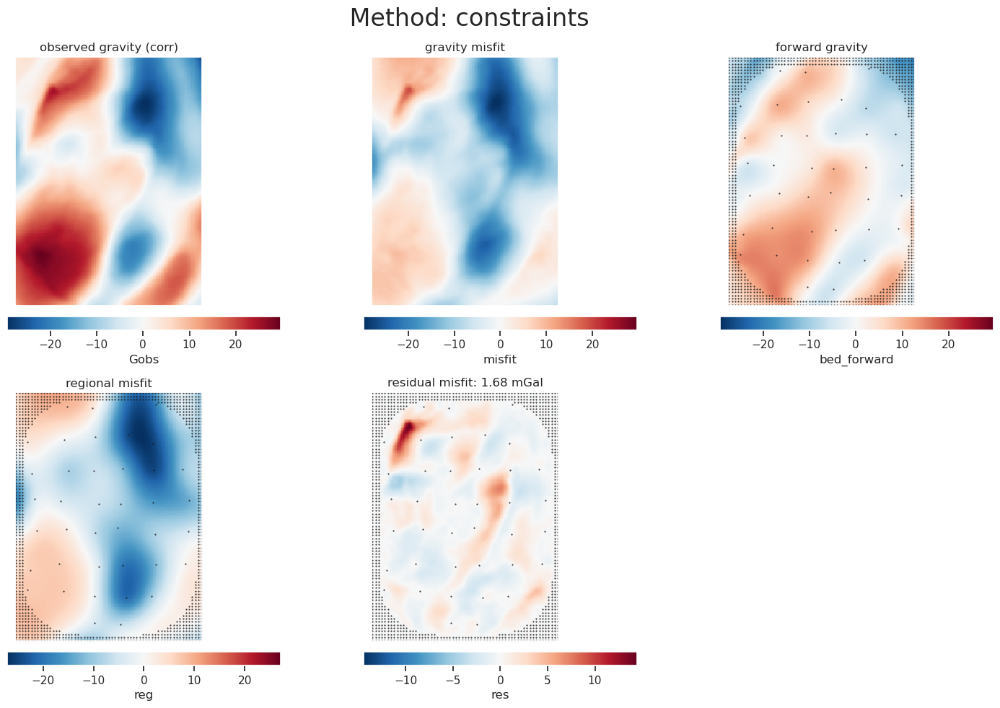

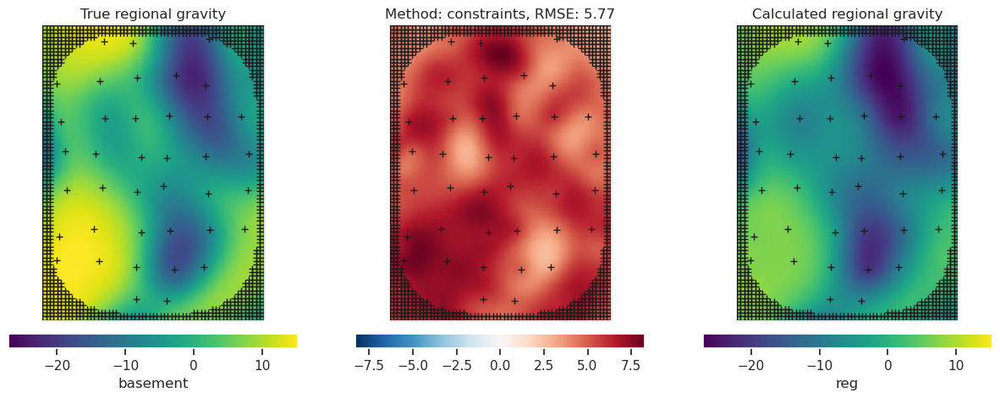

In [52]:
regional_kwargs = dict(
    input_grav=grav_df,
    input_forward_column="bed_forward",
    input_grav_column="Gobs_shift",
    grav_spacing=grav_spacing,
    inversion_region=inversion_region,
    true_regional=grav_df.set_index(["northing", "easting"]).to_xarray().basement,
    constraints=constraints,
    grid_method="verde",
    dampings=np.logspace(-15, -5, num=8),
    # grid_method="pygmt",
    # tension_factor = 0,
    # constraint_block_size=grav_spacing,
    # block_size= grav_spacing,
    regional_method="constraints",
    # regional_method = "trend",
    # trend=10,
    # regional_method = "eq_sources",
    # eq_sources = 500e3,
)

with warnings.catch_warnings():
    warnings.simplefilter("ignore", sp.linalg.LinAlgWarning)
    df_anomalies = regional.regional_seperation(
        **regional_kwargs,
        constraint_weights=1 / (constraints.uncert**2),
    )

anom_grids = plotting.anomalies_plotting(
    df_anomalies,
    title=f" Method: {regional_kwargs.get('regional_method')}",
    constraints=constraints,  # .rename(columns={"easting":"x","northing":"y"}),
    input_forward_column="bed_forward",
    input_grav_column="Gobs",
    # plot_type="pygmt",
    plot_type="xarray",
    robust=False,
)

_ = utils.grd_compare(
    regional_kwargs.get("true_regional"),
    df_anomalies.set_index(["northing", "easting"]).to_xarray().reg,
    grid1_name="True regional gravity",
    grid2_name="Calculated regional gravity",
    title=f"Method: {regional_kwargs.get('regional_method')}",
    plot=True,
    region=kwargs.get("inversion_region"),
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    plot_type="xarray",
    # plot_type="pygmt",
    # cmap="vik",
    # diff_cmap="vik+h0",
    hist=True,
    inset=False,
    points_style="c.15c",
    subplot_labels=True,
    # robust=True,
    robust=False,
    verbose="q",
    cbar_label="mGal",
)

Highest score: 0.9978159090909198
Best damping: 1e-15
Best mindist: 1.0


/Users/home/tankerma/RIS_gravity_inversion/RIS_gravity_inversion/utils.py:172: UserWarning: Warning: best damping parameter (1e-15) for verde.SplineCV() is at the limit of provided values ((1e-15, 2.6826957952797274e-14)) and thus is likely not a global minimum, expand the range of values with 'dampings'
  warnings.warn(f"Warning: best damping parameter ({spline.damping_}) for verde.SplineCV() is at the limit of provided values ({dampings[0], dampings[1]}) and thus is likely not a global minimum, expand the range of values with 'dampings'")
/Users/home/tankerma/RIS_gravity_inversion/RIS_gravity_inversion/utils.py:177: UserWarning: Warning: best minimum distance parameter (1.0) for verde.SplineCV() is at the limit of provided values ((1.0, 715.1428571428571)) and thus is likely not a global minimum, expand the range of values with 'mindists'
  warnings.warn(f"Warning: best minimum distance parameter ({spline.mindist_}) for verde.SplineCV() is at the limit of provided values ({mindists[0

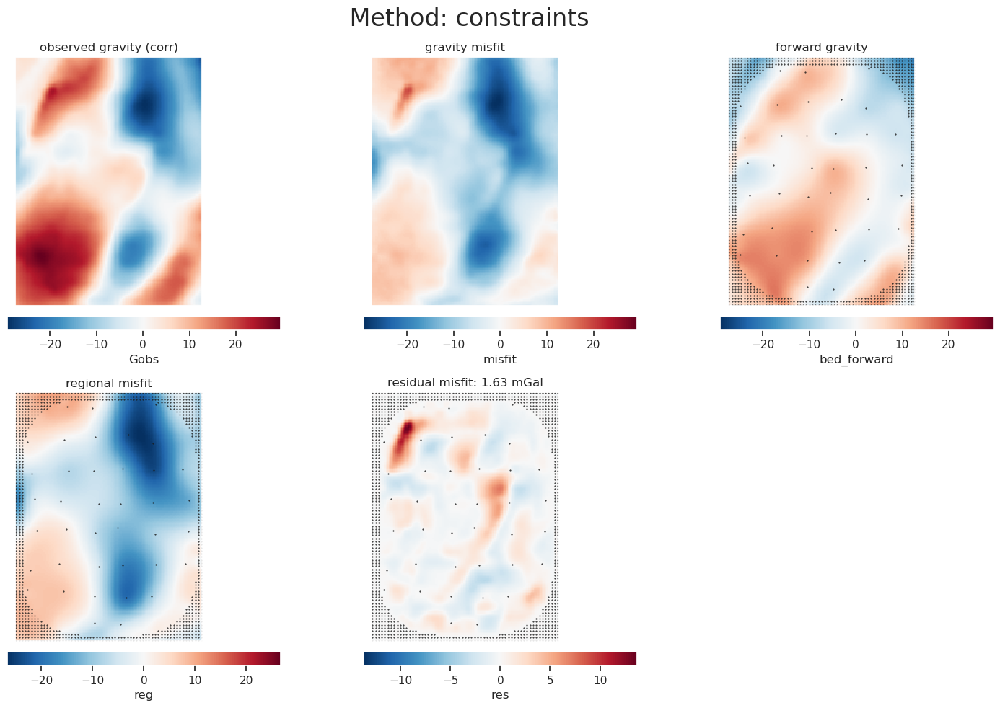

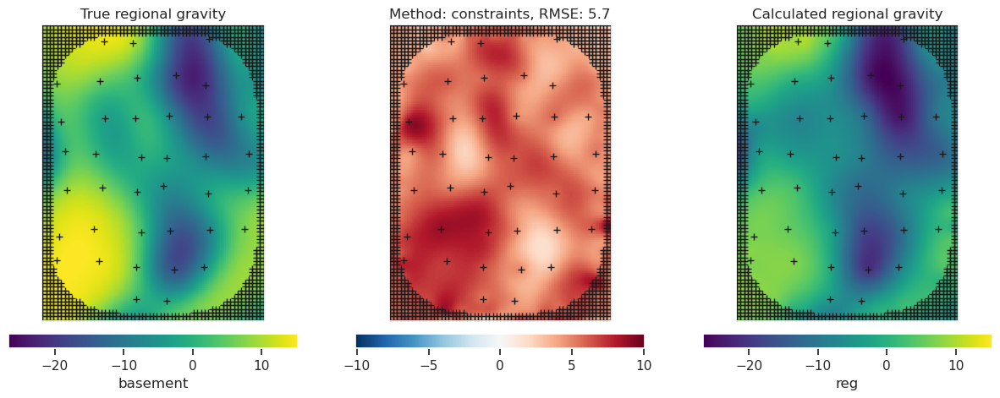

In [53]:
regional_kwargs = dict(
    input_grav=grav_survey_df,
    input_forward_column="bed_forward",
    input_grav_column="Gobs_shift",
    grav_spacing=grav_spacing,
    inversion_region=inversion_region,
    true_regional=grav_df.set_index(["northing", "easting"]).to_xarray().basement,
    constraints=constraints,
    grid_method="verde",
    dampings=np.logspace(-15, -5, num=8),
    # grid_method="pygmt",
    # tension_factor = 0,
    # constraint_block_size=grav_spacing,
    # block_size= grav_spacing,
    regional_method="constraints",
    # regional_method = "trend",
    # trend=10,
    # regional_method = "eq_sources",
    # eq_sources = 500e3,
)

with warnings.catch_warnings():
    warnings.simplefilter("ignore", sp.linalg.LinAlgWarning)
    df_survey_anomalies = regional.regional_seperation(
        **regional_kwargs,
        constraint_weights=1 / (constraints.uncert**2),
    )

anom_grids = plotting.anomalies_plotting(
    df_survey_anomalies,
    title=f" Method: {regional_kwargs.get('regional_method')}",
    constraints=constraints,  # .rename(columns={"easting":"x","northing":"y"}),
    input_forward_column="bed_forward",
    input_grav_column="Gobs",
    # plot_type="pygmt",
    plot_type="xarray",
    robust=False,
)

_ = utils.grd_compare(
    regional_kwargs.get("true_regional"),
    df_survey_anomalies.set_index(["northing", "easting"]).to_xarray().reg,
    grid1_name="True regional gravity",
    grid2_name="Calculated regional gravity",
    title=f"Method: {regional_kwargs.get('regional_method')}",
    plot=True,
    region=kwargs.get("inversion_region"),
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    plot_type="xarray",
    # plot_type="pygmt",
    # cmap="vik",
    # diff_cmap="vik+h0",
    hist=True,
    inset=False,
    points_style="c.15c",
    subplot_labels=True,
    # robust=True,
    robust=False,
    verbose="q",
    cbar_label="mGal",
)

### Save and load results

In [26]:
# df_anomalies.to_csv(
#     "../synthetic_data/Ross_Sea_gravity_anomalies.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )
# df_survey_anomalies.to_csv(
#     "../synthetic_data/Ross_Sea_gravity_anomalies_survey.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )

In [84]:
df_anomalies = pd.read_csv(
    "../synthetic_data/Ross_Sea_gravity_anomalies.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df_survey_anomalies = pd.read_csv(
    "../synthetic_data/Ross_Sea_gravity_anomalies_survey.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df_anomalies

,northing,easting,basement,bathymetry,Gobs,test,upward,bed_forward,Gobs_shift,misfit,reg,res
0,-1800000.0,-40000.0,10.954490,1.539214,12.493704,False,1000.0,1.588803,6.559877,4.971074,5.103099,-0.132025
1,-1800000.0,-37500.0,11.301743,2.179182,13.480925,True,1000.0,2.189981,7.547098,5.357117,5.361853,-0.004736
2,-1800000.0,-35000.0,11.628426,2.738309,14.366735,False,1000.0,2.731633,8.432908,5.701275,5.604120,0.097155
3,-1800000.0,-32500.0,11.926100,3.121790,15.047890,True,1000.0,3.225948,9.114063,5.888115,5.799968,0.088147
4,-1800000.0,-30000.0,12.197463,3.460530,15.657992,False,1000.0,3.687668,9.724166,6.036497,5.973240,0.063257
...,...,...,...,...,...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-4.359605,-16.596796,-20.956401,False,1000.0,-16.379783,-26.890228,-10.510445,-10.511134,0.000689
19477,-1400000.0,252500.0,-5.283528,-16.946833,-22.230361,True,1000.0,-16.835889,-28.164188,-11.328299,-11.388003,0.059705
19478,-1400000.0,255000.0,-6.260088,-17.317246,-23.577334,False,1000.0,-17.321311,-29.511161,-12.189849,-12.284540,0.094691
19479,-1400000.0,257500.0,-7.275874,-17.744627,-25.020501,True,1000.0,-17.722308,-30.954328,-13.232020,-13.233208,0.001189


# Constraints grid

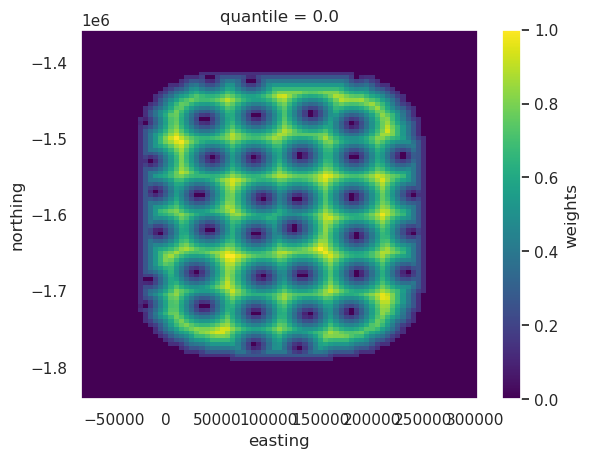

In [85]:
starting_prisms = copy.deepcopy(bed_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    region=inversion_region,
)
starting_prisms["weights"] = min_dist
starting_prisms.weights.plot()

In [69]:
# enc = {x: {"compressor": zarr.Blosc()} for x in starting_prisms}
# starting_prisms.to_zarr(
#     "../inversion_layers/Ross_Sea_starting_prisms.zarr",
#     encoding=enc,
#     mode="w",
# )

In [11]:
# starting_prisms = xr.open_zarr(
#     "../inversion_layers/Ross_Sea_starting_prisms.zarr",
# )

In [ ]:
# min_dist = inv_utils.normalized_mindist(constraints, starting_prisms, mindist = layer_spacing/np.sqrt(2),)

# fig = maps.plot_grd(
#     min_dist,
#     region=inversion_region,
#     fig_height=10,
#     title="Weighting grid",
#     # title_font="12p,Helvetica-Bold",
#     cmap="dense",
#     # hist=True,
#     # cbar_yoffset=1.5,
#     cbar_unit_annot="km",
#     cbar_scale=.001,
# )

# fig.plot(
#     x = constraints[constraints.inside].easting,
#     y = constraints[constraints.inside].northing,
#     style = "x0.2c",
#     pen='1p',
# )
# fig.plot(
#     x = constraints[constraints.inside==False].easting,
#     y = constraints[constraints.inside==False].northing,
#     style = "x0.1c",
#     pen='.5p',
# )

# pygmt.grd2cpt(grid=starting_prisms.weights, continuous=True, background="i", cmap="dense",)
# with pygmt.config(
#     FONT_ANNOT="Helvetica-Oblique",
#     MAP_ANNOT_OFFSET_PRIMARY="18p",
#     MAP_TICK_LENGTH_PRIMARY="0p", ):
#     maps.add_colorbar(fig=fig, )#cbar_yoffset=None)

# fig.show()

# Inversion

Now that we have $G_{misfit}$, we can run an inversion to attempt to recover the true bathymetry. 

In [71]:
# starting_prisms = copy.deepcopy(bed_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     region=inversion_region,
# )
# starting_prisms["weights"] = min_dist#**.5

# # set kwargs for inversion
# kwargs = dict(
#     input_grav_column="Gobs_shift",
#     prism_layer=starting_prisms,
#     max_iterations=100,
#     l2_norm_tolerance=0.15,
#     delta_l2_norm_tolerance=1.02, # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving = True,
#     deriv_type = "annulus",
#     solver_type = "scipy least squares",
#     solver_damping = 10**-2,
#     plot_convergence=True,
# )

# df = df_survey_anomalies

# # with inv_utils.HiddenPrints():
# inv_result = inv.inversion_RMSE(
#     input_grav=df[df.test==False],
#     inversion_region=inversion_region,
#     true_surface = bed,
#     constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
#     plot=True,
#     plot_type="xarray",
#     # robust=True,
#     **kwargs,
# )

# (
#     rmse,
#     prism_results,
#     grav_results,
#     params,
#     elapsed_time,
#     constraints_rmse,
# ) = inv_result

# _ = plotting.plot_inversion_results(
#         grav_results,
#         prism_results,
#         params,
#         grav_region=inversion_region,
#         plot_iter_results=True,
#         plot_topo_results=True,
#         plot_grav_results=True,
#         iters_to_plot=4,
#         grav_spacing=grav_spacing,
#         constraints=constraints,
#     )

# plotting.plot_inversion_results_profile(
#     inv_result[1],
#     inv_result[2],
#     input_forward_column="bed_forward",
#     constraints = constraints[constraints.inside],
#     true_surface = bed,
#     start = [inversion_region[0], inversion_region[3]],
#     stop = [inversion_region[1], inversion_region[2]],
#     map_buffer = 0.02,
#     subplot_orientation='horizontal',
#     data_legend_loc = "jBR+o0c",
#     layers_legend_loc = "jBR+o0c",
#     layers_frame = ["nEsw","xafg", "ya+lElevation (m)"],
#     data_frame = ["nEsw","xafg", "ya+lGravity (mGal)"],
# )

# # print(f"RMSE: {rmse}")
# # print(f"constraints RMSE: {constraints_rmse}")
# # # get last iteration's layer result

# # ds = prism_results.set_index(["northing", "easting"]).to_xarray()
# # cols = [s for s in prism_results.columns.to_list() if "_layer" in s]
# # final_bed = ds[cols[-1]]

### Optimize only for damping

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]
Best score: 0.046134033558538144
Best damping: 0.01


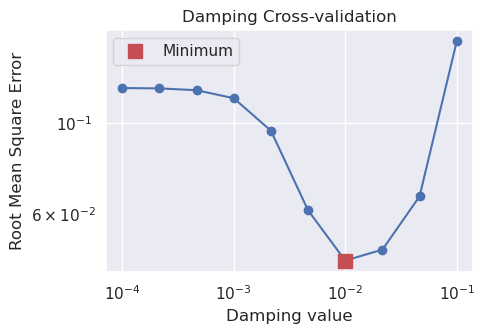

In [13]:
starting_prisms = copy.deepcopy(bed_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    region=inversion_region,
)
starting_prisms["weights"] = min_dist

# set kwargs for inversion
kwargs = dict(
    input_grav_column="Gobs_shift",
    prism_layer=starting_prisms,
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    constraints=constraints,
)

fname = "../synthetic_data/Ross_Sea_full_res_damping_CV_2500_dens"

dampings = np.logspace(-4, -1, 10)
print(f"Damping values: {dampings}")

# scores, rmses = inv.inversion_optimal_parameters(
#     training_data= df_anomalies[df_anomalies.test==False],
#     testing_data = df_anomalies[df_anomalies.test==True],
#     parameter_values = dampings,
#     function = inv.inversion_damping_MSE,
#     plot = False,
#     plot_grids = False,
#     results_fname=fname,
#     progressbar=True,
#     true_surface=bed,
#     inversion_region=inversion_region,
#     **kwargs,
# )

# # put scores and damping values into dict
# CV_results = dict(
#     scores=scores, dampings=dampings, rmses=rmses)

# # remove if exists
# pathlib.Path(fname).unlink(missing_ok=True)

# # save scores and dampings to pickle
# with open(f"{fname}.pickle", 'wb') as f:
#     pickle.dump(CV_results, f)

# load scores and dampings from pickle
with open(f"{fname}.pickle", "rb") as f:
    CV_results = pickle.load(f)

best = np.argmin(CV_results["scores"])
print("Best score:", CV_results["scores"][best])
print("Best damping:", CV_results["dampings"][best])

# get best inversion result of each set
with open(f"{fname}_trial_{best}.pickle", "rb") as f:
    inv_result = pickle.load(f)

plotting.plot_parameter_cv(
    CV_results["scores"],
    CV_results["dampings"],
    logx=True,
    logy=True,
    param_name="Damping",
)

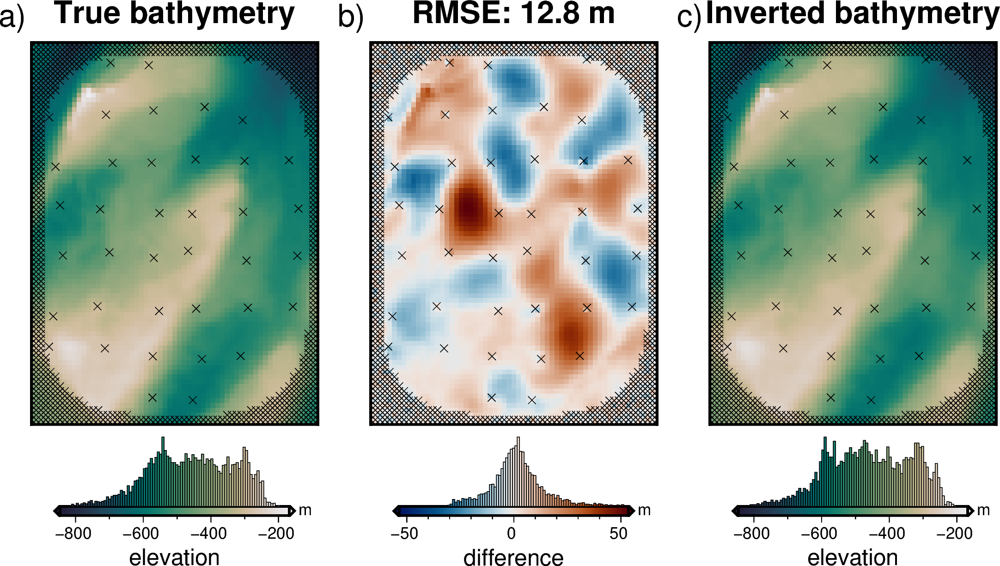

RMSE: 12.775578236780566
constraints RMSE: 0.39


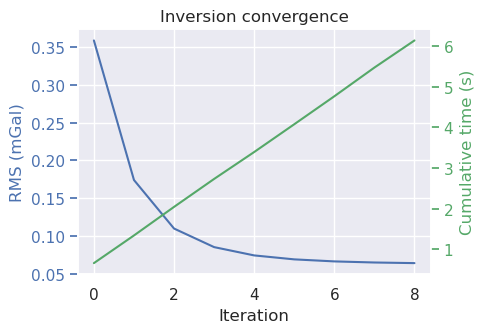

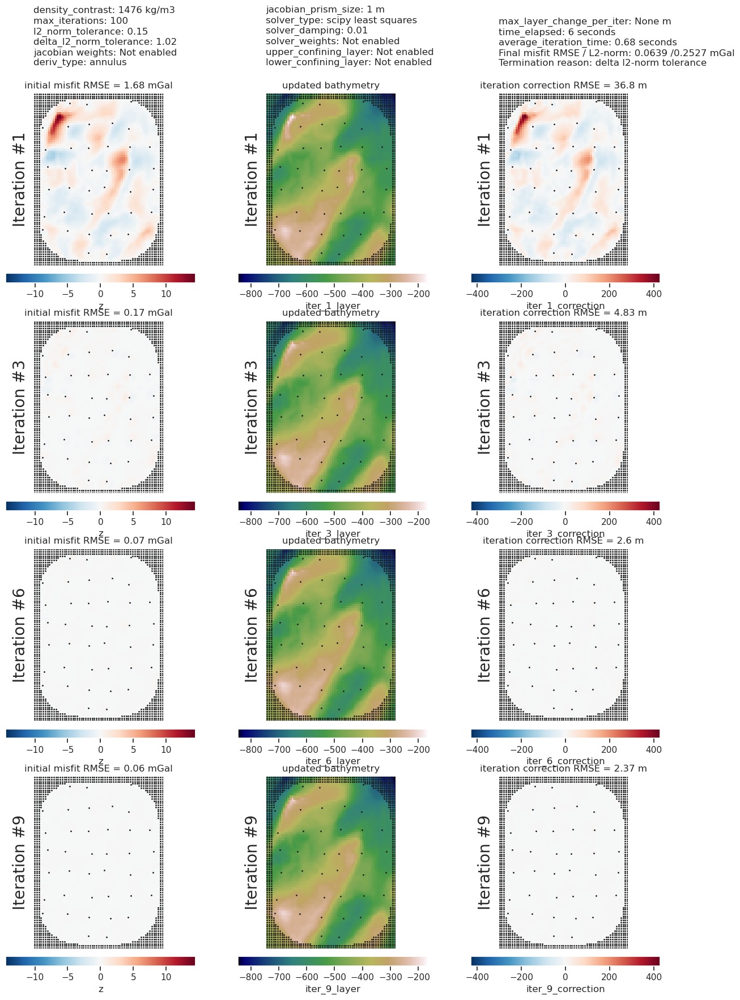

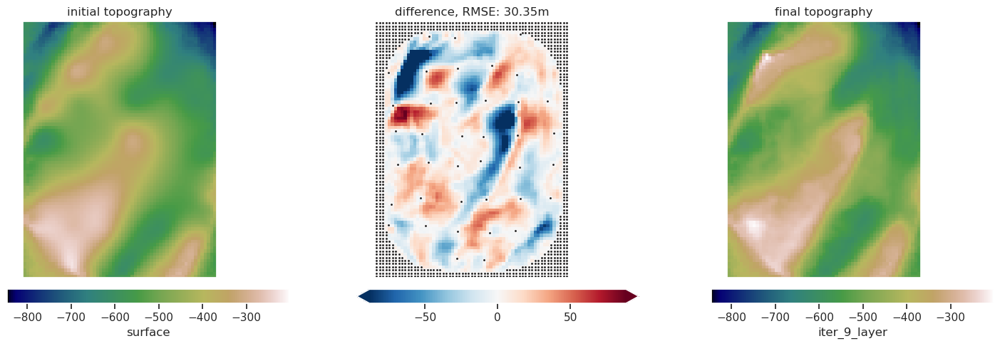

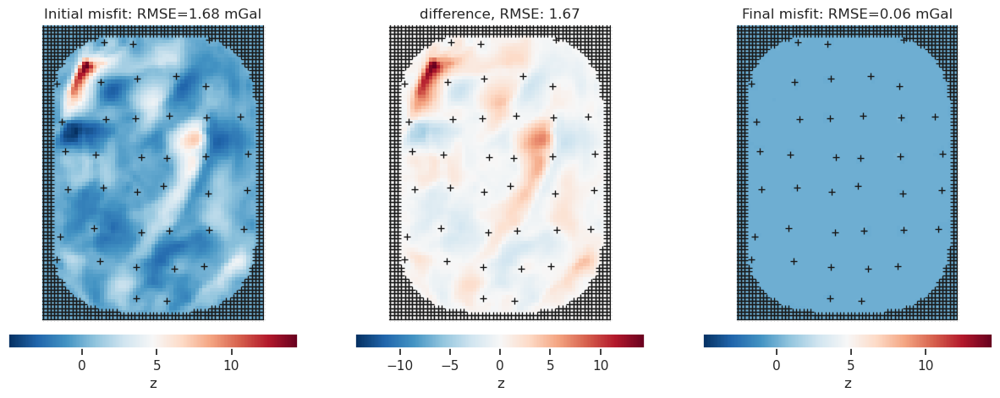

In [56]:
with inv_utils.HiddenPrints():
    _ = inv.inversion_RMSE(
        results=inv_result,
        input_grav=df_anomalies[df_anomalies.test == False],
        inversion_region=inversion_region,
        true_surface=bed,
        plot=True,
        plot_type="pygmt",
        xshift_amount=1.1,
        label_offset="j-.6c/.3c",
        title_font="16p,Helvetica-Bold,black",
        **kwargs,
    )

plotting.plot_convergence(inv_result[2], iter_times=inv_result[3]["iter_times"])

_ = plotting.plot_inversion_results(
    inv_result[2],
    inv_result[1],
    inv_result[3],
    grav_region=inversion_region,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    iters_to_plot=4,
    grav_spacing=grav_spacing,
    constraints=constraints,
)

print(f"RMSE: {inv_result[0]}")
print(f"constraints RMSE: {inv_result[-1]}")

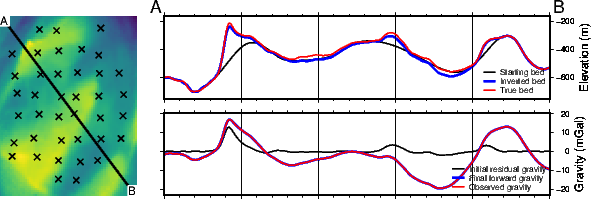

In [16]:
plotting.plot_inversion_results_profile(
    inv_result[1],
    inv_result[2],
    input_forward_column="bed_forward",
    constraints=constraints[constraints.inside],
    true_surface=bed,
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    map_buffer=0.02,
    subplot_orientation="horizontal",
    data_legend_loc="jBR+o0c",
    layers_legend_loc="jBR+o0c",
    layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
    data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
)

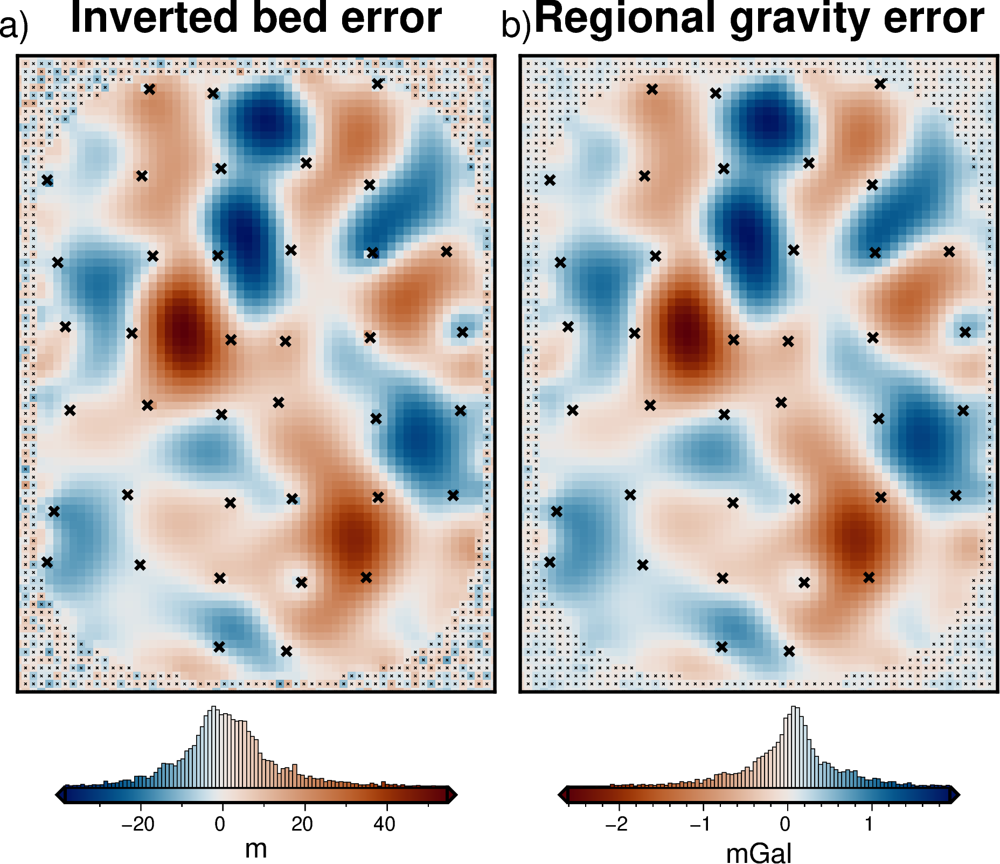

In [172]:
# # inverted bed error
# ds = inv_result[1].set_index(["northing","easting"]).to_xarray()
# cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
# final_bed = ds[cols[-1]]

# final_bed = final_bed.sel(
#     easting=slice(inversion_region[0], inversion_region[1]),
#     northing=slice(inversion_region[2], inversion_region[3]),
# )
# true_bed = bed.sel(
#     easting=slice(inversion_region[0], inversion_region[1]),
#     northing=slice(inversion_region[2], inversion_region[3]),
# )
# bed_dif = true_bed - final_bed

# # regional separation error
# ds = inv_result[2][inv_result[2].test==False].set_index(['northing','easting']).to_xarray()
# true_reg = true_regional_grav
# reg_dif = true_reg - ds.reg
# reg_dif -= np.nanmean(reg_dif)

# fig = maps.plot_grd(
#     bed_dif,
#     fig_height=10,
#     title = "Inverted bed error",
#     hist = True,
#     points = constraints[constraints.inside].rename(columns={"easting":"x","northing":"y"}),
#     points_style = "x.2c",
#     points_pen = "1.5p",
#     cmap = "vik+h0",
#     cbar_label = "m",
#     cbar_yoffset = 1.5,
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="a)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )
# fig.plot(
#     x = constraints[constraints.inside==False].easting,
#     y = constraints[constraints.inside==False].northing,
#     style = "x.05c",
# )

# fig = maps.plot_grd(
#     reg_dif,
#     title = "Regional gravity error",
#     cmap = f"vik+h0",
#     reverse_cpt=True,
#     fig = fig,
#     hist = True,
#     points = constraints[constraints.inside].rename(columns={"easting":"x","northing":"y"}),
#     points_style = "x.2c",
#     points_pen = "1.5p",
#     origin_shift = "xshift",
#     cbar_label = "mGal",
#     cbar_yoffset = 1.5,
# )

# fig.text(
#     position="TL",
#     justify="BL",
#     text="b)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )
# fig.plot(
#     x = constraints[constraints.inside==False].easting,
#     y = constraints[constraints.inside==False].northing,
#     style = "x.05c",
# )
# fig.show()

### Repeat with noise

Standard deviation used for noise: [0.5926470115993936]
DC shifted observed gravity by 5.92mGal to match forward gravity.
Highest score: 0.9929387421406053
Best damping: 5.179474679231223e-10
Best mindist: 1429.2857142857142
Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]


Hyperparameter:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

  0%|                                                 | 0/14540 [00:00<?, ?it/s]

Best score of 0.6639915531886895 with Hyperparameter=0.046415888336127774
Best score: 0.6639915531886895
Best damping: 0.046415888336127774


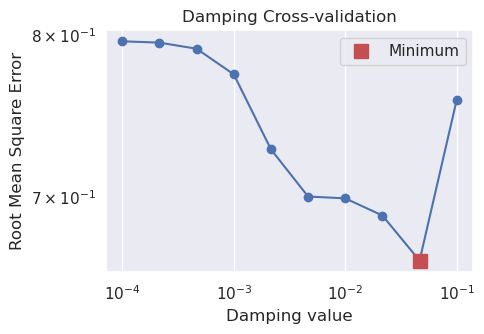

In [35]:
# contaminate with noise
grav_df_noise = grav_df.copy()
grav_df_noise["Gobs"] = synthetic.contaminate(
    grav_df_noise.Gobs,
    stddev=0.02,
    percent=True,
    seed=0,
)

regional_kwargs = dict(
    input_grav=grav_df_noise,
    input_forward_column="bed_forward",
    input_grav_column="Gobs",
    grav_spacing=grav_spacing,
    inversion_region=inversion_region,
    true_regional=grav_df.set_index(["northing", "easting"]).to_xarray().basement,
    constraints=constraints,
    grid_method="verde",
    dampings=np.logspace(-15, -5, num=8),
    regional_method="constraints",
)

with warnings.catch_warnings():
    warnings.simplefilter("ignore", sp.linalg.LinAlgWarning)
    df_anomalies_noise = regional.regional_seperation(
        **regional_kwargs,
        constraint_weights=1 / (constraints.uncert**2),
    )

starting_prisms = copy.deepcopy(bed_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    region=inversion_region,
)
starting_prisms["weights"] = min_dist

# set kwargs for inversion
kwargs = dict(
    input_grav_column="Gobs_shift",
    prism_layer=starting_prisms,
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    constraints=constraints,
)

fname = "../synthetic_data/Ross_Sea_full_res_noise_damping_CV"

dampings = np.logspace(-4, -1, 10)
print(f"Damping values: {dampings}")

scores, rmses = inv.inversion_optimal_parameters(
    training_data=df_anomalies_noise[df_anomalies_noise.test == False],
    testing_data=df_anomalies_noise[df_anomalies_noise.test == True],
    parameter_values=dampings,
    function=inv.inversion_damping_MSE,
    plot=False,
    plot_grids=False,
    results_fname=fname,
    progressbar=True,
    true_surface=bed,
    inversion_region=inversion_region,
    **kwargs,
)

# put scores and damping values into dict
CV_results = dict(scores=scores, dampings=dampings, rmses=rmses)

# remove if exists
pathlib.Path(fname).unlink(missing_ok=True)

# save scores and dampings to pickle
with open(f"{fname}.pickle", "wb") as f:
    pickle.dump(CV_results, f)

# load scores and dampings from pickle
with open(f"{fname}.pickle", "rb") as f:
    CV_results = pickle.load(f)

best = np.argmin(CV_results["scores"])
print("Best score:", CV_results["scores"][best])
print("Best damping:", CV_results["dampings"][best])

# get best inversion result of each set
with open(f"{fname}_trial_{best}.pickle", "rb") as f:
    inv_result = pickle.load(f)

plotting.plot_parameter_cv(
    CV_results["scores"],
    CV_results["dampings"],
    logx=True,
    logy=True,
    param_name="Damping",
)

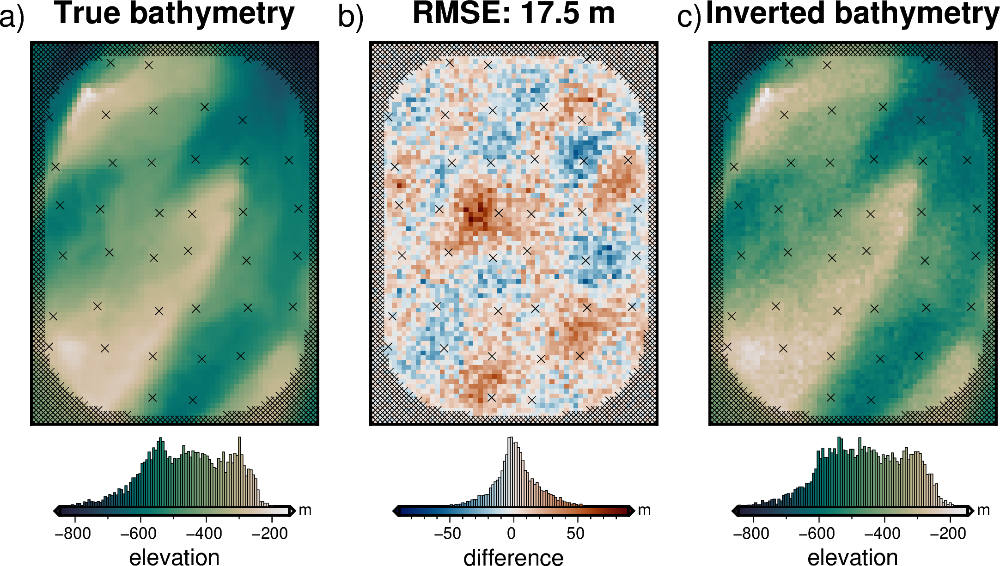

RMSE: 17.501743690877596
constraints RMSE: 0.39


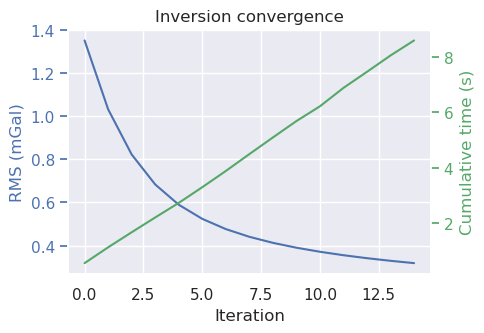

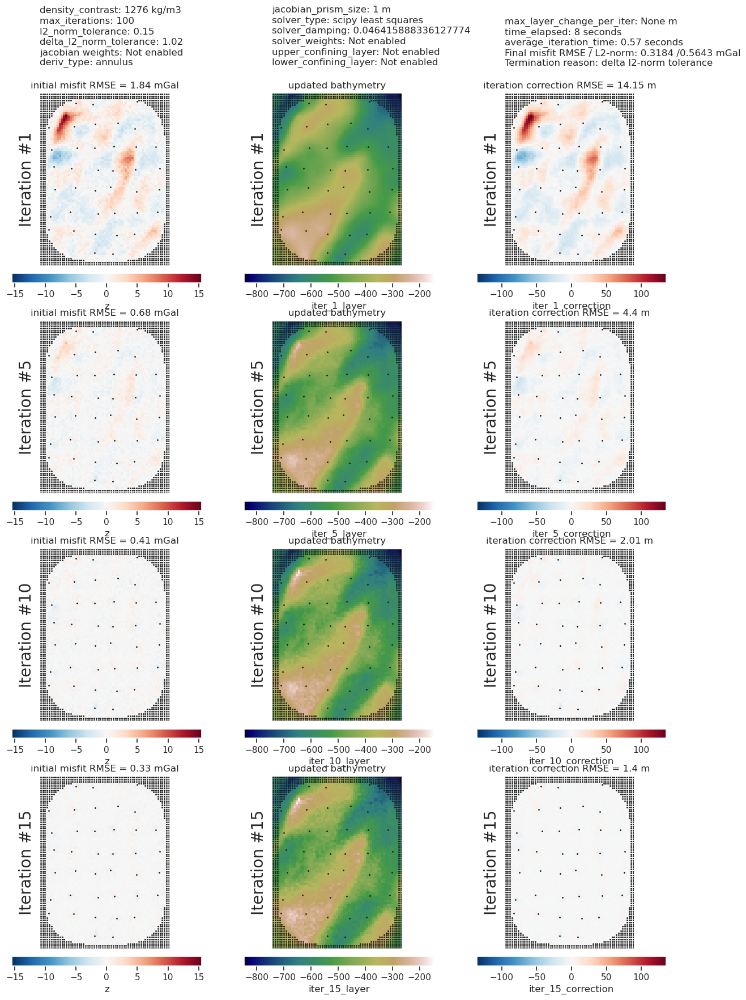

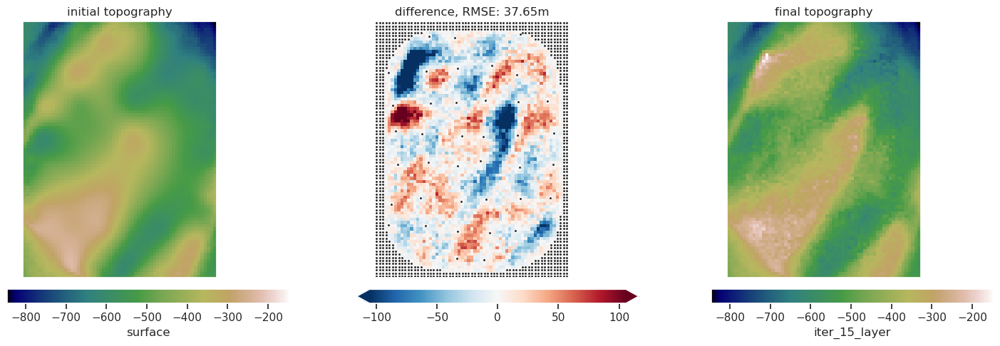

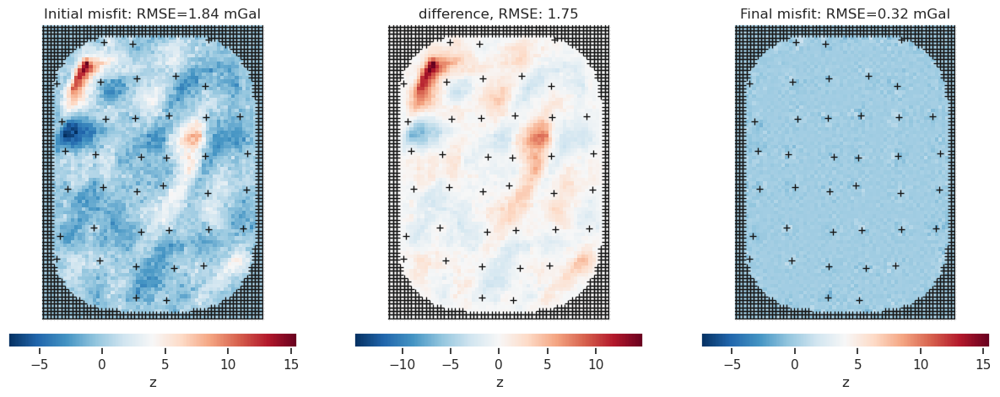

In [36]:
with inv_utils.HiddenPrints():
    _ = inv.inversion_RMSE(
        results=inv_result,
        input_grav=df_anomalies_noise[df_anomalies_noise.test == False],
        inversion_region=inversion_region,
        true_surface=bed,
        plot=True,
        plot_type="pygmt",
        xshift_amount=1.1,
        label_offset="j-.6c/.3c",
        title_font="16p,Helvetica-Bold,black",
        **kwargs,
    )

plotting.plot_convergence(inv_result[2], iter_times=inv_result[3]["iter_times"])

_ = plotting.plot_inversion_results(
    inv_result[2],
    inv_result[1],
    inv_result[3],
    grav_region=inversion_region,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    iters_to_plot=4,
    grav_spacing=grav_spacing,
    constraints=constraints,
)

print(f"RMSE: {inv_result[0]}")
print(f"constraints RMSE: {inv_result[-1]}")

### Repeat with survey data

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]
Best score: 0.044065225237356946
Best damping: 0.01


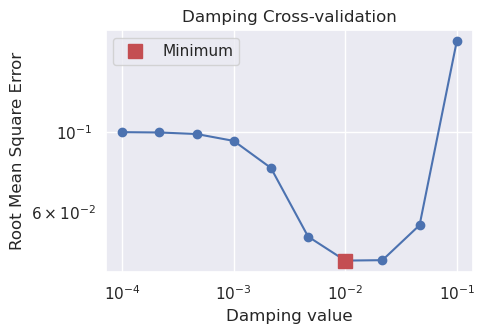

In [174]:
# starting_prisms = copy.deepcopy(bed_prisms)

# min_dist = inv_utils.normalized_mindist(
#     constraints,
#     starting_prisms,
#     mindist = layer_spacing/np.sqrt(2),
#     low = 0,
#     high = 1,
#     region=inversion_region,
# )
# starting_prisms["weights"] = min_dist

# # set kwargs for inversion
# kwargs = dict(
#     input_grav_column="Gobs_shift",
#     prism_layer=starting_prisms,
#     max_iterations=100,
#     l2_norm_tolerance=0.15, # sqrt(RMS)=l2-norm, set to sqrt(noise)
#     delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
#     weights_after_solving=True,
#     deriv_type="annulus",
#     solver_type="scipy least squares",
#     constraints = constraints,
# )

# fname = "../synthetic_data/Ross_Sea_survey_damping_CV"

# dampings = np.logspace(-4, -1, 10)
# print(f"Damping values: {dampings}")

# # scores, rmses = inv.inversion_optimal_parameters(
# #     training_data= df_survey_anomalies[df_survey_anomalies.test==False],
# #     testing_data = df_survey_anomalies[df_survey_anomalies.test==True],
# #     parameter_values = dampings,
# #     function = inv.inversion_damping_MSE,
# #     plot = False,
# #     plot_grids = False,
# #     results_fname=fname,
# #     progressbar=True,
# #     true_surface=bed,
# #     inversion_region=inversion_region,
# #     **kwargs,
# # )

# # # put scores and damping values into dict
# # CV_results = dict(
# #     scores=scores, dampings=dampings, rmses=rmses)

# # # remove if exists
# # pathlib.Path(fname).unlink(missing_ok=True)

# # # save scores and dampings to pickle
# # with open(f"{fname}.pickle", 'wb') as f:
# #     pickle.dump(CV_results, f)

# # load scores and dampings from pickle
# with open(f"{fname}.pickle", 'rb') as f:
#     CV_results=pickle.load(f)

# best = np.argmin(CV_results["scores"])
# print("Best score:", CV_results["scores"][best])
# print("Best damping:", CV_results["dampings"][best])

# # get best inversion result of each set
# with open(f"{fname}_trial_{best}.pickle", 'rb') as f:
#     inv_result = pickle.load(f)

# plotting.plot_parameter_cv(CV_results["scores"], CV_results["dampings"],
#     logx=True, logy=True, param_name = "Damping", )

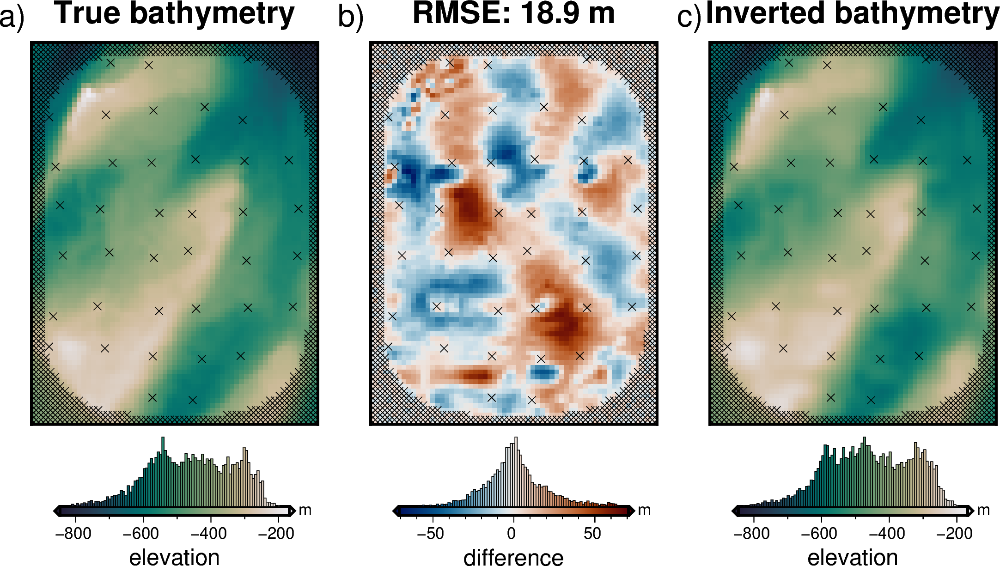

RMSE: 18.935142931367764
constraints RMSE: 0.46


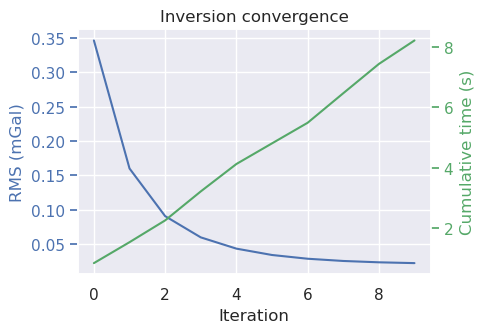

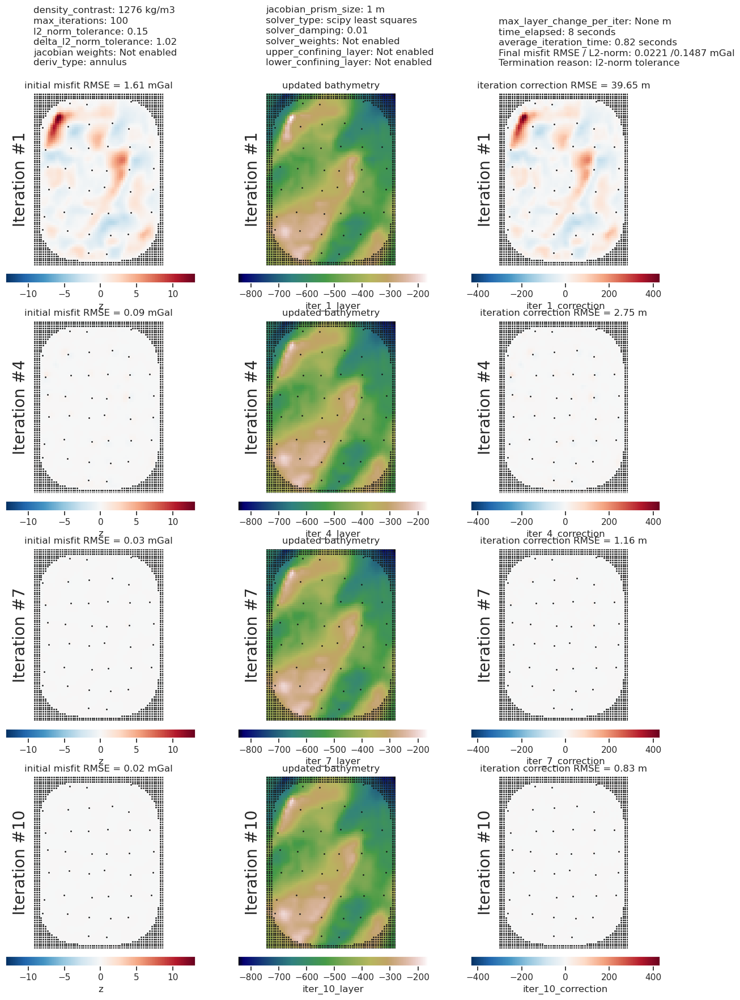

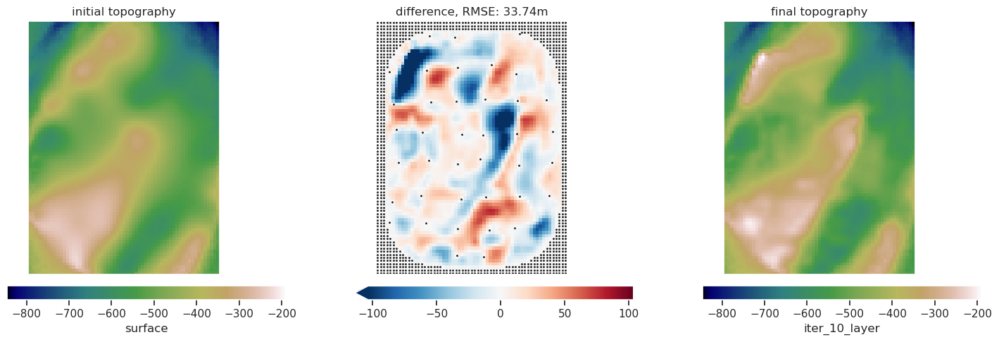

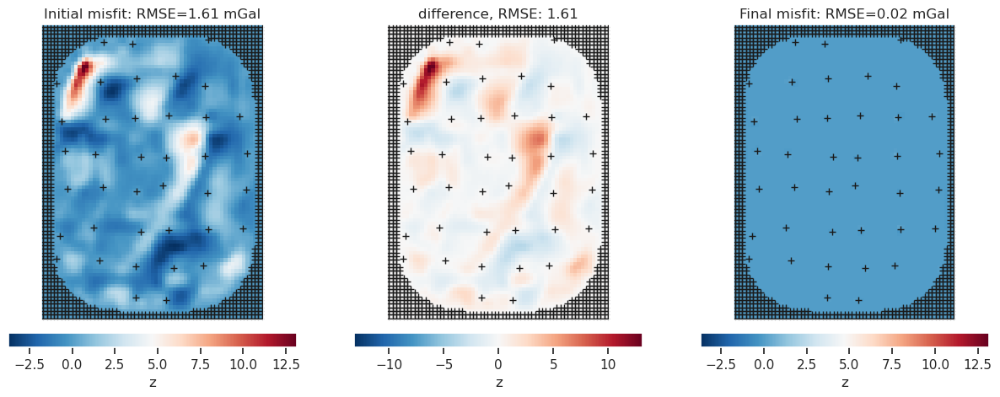

In [168]:
# with inv_utils.HiddenPrints():
#     _ = inv.inversion_RMSE(
#         results=inv_result,
#         input_grav=df_survey_anomalies[df_survey_anomalies.test==False],
#         inversion_region=inversion_region,
#         true_surface = bed,
#         plot=True,
#         plot_type="pygmt",
#         xshift_amount = 1.1,
#         label_offset = "j-.6c/.3c",
#         title_font = "16p,Helvetica-Bold,black",
#         **kwargs,
#     )

# plotting.plot_convergence(
#     inv_result[2],
#     iter_times=inv_result[3]["iter_times"])

# _ = plotting.plot_inversion_results(
#         inv_result[2],
#         inv_result[1],
#         inv_result[3],
#         grav_region=inversion_region,
#         plot_iter_results=True,
#         plot_topo_results=True,
#         plot_grav_results=True,
#         iters_to_plot=4,
#         grav_spacing=grav_spacing,
#         constraints=constraints,
#     )

# print(f"RMSE: {inv_result[0]}")
# print(f"constraints RMSE: {inv_result[-1]}")

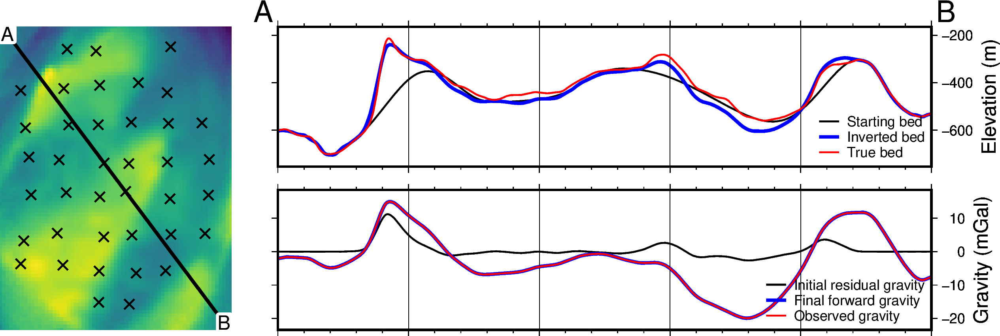

In [169]:
# plotting.plot_inversion_results_profile(
#     inv_result[1],
#     inv_result[2],
#     input_forward_column="bed_forward",
#     constraints = constraints[constraints.inside],
#     true_surface = bed,
#     start = [inversion_region[0], inversion_region[3]],
#     stop = [inversion_region[1], inversion_region[2]],
#     map_buffer = 0.02,
#     subplot_orientation='horizontal',
#     data_legend_loc = "jBR+o0c",
#     layers_legend_loc = "jBR+o0c",
#     layers_frame = ["nEsw","xafg", "ya+lElevation (m)"],
#     data_frame = ["nEsw","xafg", "ya+lGravity (mGal)"],
# )

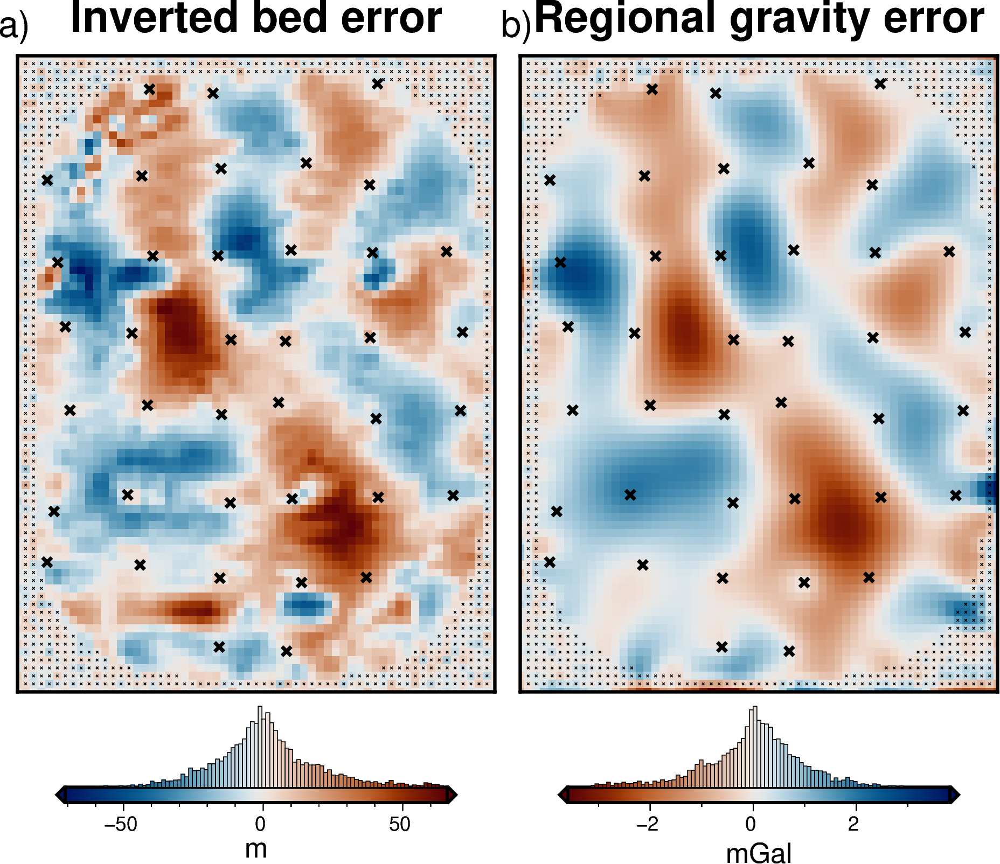

In [175]:
# # inverted bed error
# ds = inv_result[1].set_index(["northing","easting"]).to_xarray()
# cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
# final_bed = ds[cols[-1]]

# final_bed = final_bed.sel(
#     easting=slice(inversion_region[0], inversion_region[1]),
#     northing=slice(inversion_region[2], inversion_region[3]),
# )
# true_bed = bed.sel(
#     easting=slice(inversion_region[0], inversion_region[1]),
#     northing=slice(inversion_region[2], inversion_region[3]),
# )
# bed_dif = true_bed - final_bed

# # regional separation error
# ds = inv_result[2][inv_result[2].test==False].set_index(['northing','easting']).to_xarray()
# true_reg = true_regional_grav
# reg_dif = true_reg - ds.reg
# reg_dif -= np.nanmean(reg_dif)

# fig = maps.plot_grd(
#     bed_dif,
#     fig_height=10,
#     title = "Inverted bed error",
#     hist = True,
#     points = constraints[constraints.inside].rename(columns={"easting":"x","northing":"y"}),
#     points_style = "x.2c",
#     points_pen = "1.5p",
#     cmap = "vik+h0",
#     cbar_label = "m",
#     cbar_yoffset = 1.5,
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="a)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )
# fig.plot(
#     x = constraints[constraints.inside==False].easting,
#     y = constraints[constraints.inside==False].northing,
#     style = "x.05c",
# )

# fig = maps.plot_grd(
#     reg_dif,
#     title = "Regional gravity error",
#     cmap = f"vik+h0",
#     reverse_cpt=True,
#     fig = fig,
#     hist = True,
#     points = constraints[constraints.inside].rename(columns={"easting":"x","northing":"y"}),
#     points_style = "x.2c",
#     points_pen = "1.5p",
#     origin_shift = "xshift",
#     cbar_label = "mGal",
#     cbar_yoffset = 1.5,
# )

# fig.text(
#     position="TL",
#     justify="BL",
#     text="b)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )
# fig.plot(
#     x = constraints[constraints.inside==False].easting,
#     y = constraints[constraints.inside==False].northing,
#     style = "x.05c",
# )
# fig.show()

# Repeat with noisey survey data

Standard deviation used for noise: [0.5923857082668453]
DC shifted observed gravity by 5.76mGal to match forward gravity.
Highest score: 0.9915992847669782
Best damping: 5.179474679231223e-10
Best mindist: 1.0


/Users/home/tankerma/RIS_gravity_inversion/RIS_gravity_inversion/utils.py:177: UserWarning: Warning: best minimum distance parameter (1.0) for verde.SplineCV() is at the limit of provided values ((1.0, 715.1428571428571)) and thus is likely not a global minimum, expand the range of values with 'mindists'
  warnings.warn(f"Warning: best minimum distance parameter ({spline.mindist_}) for verde.SplineCV() is at the limit of provided values ({mindists[0], mindists[1]}) and thus is likely not a global minimum, expand the range of values with 'mindists'")


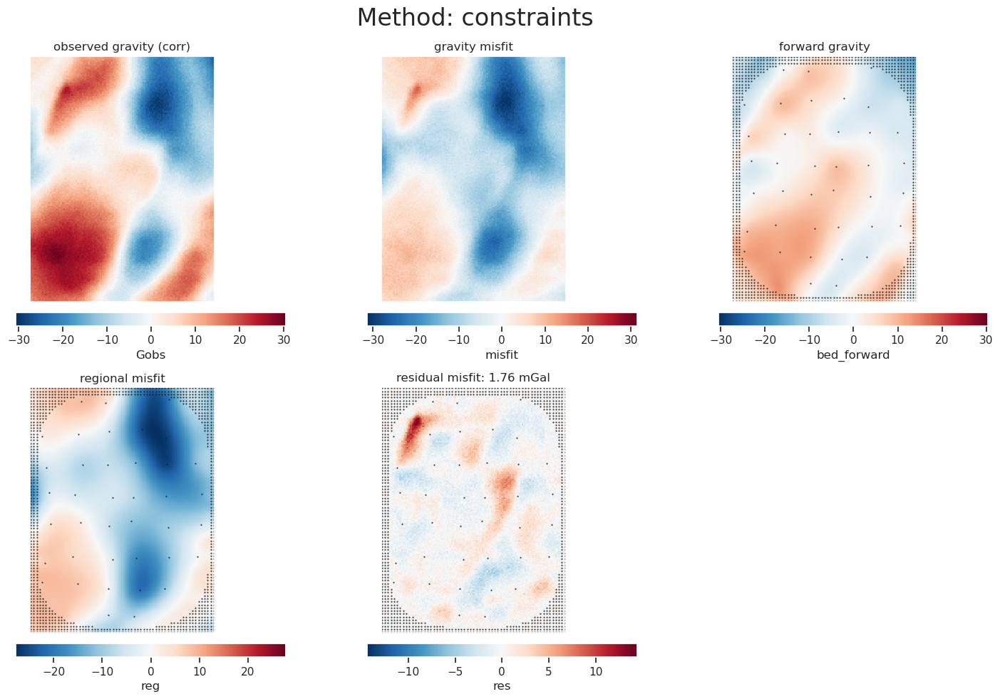

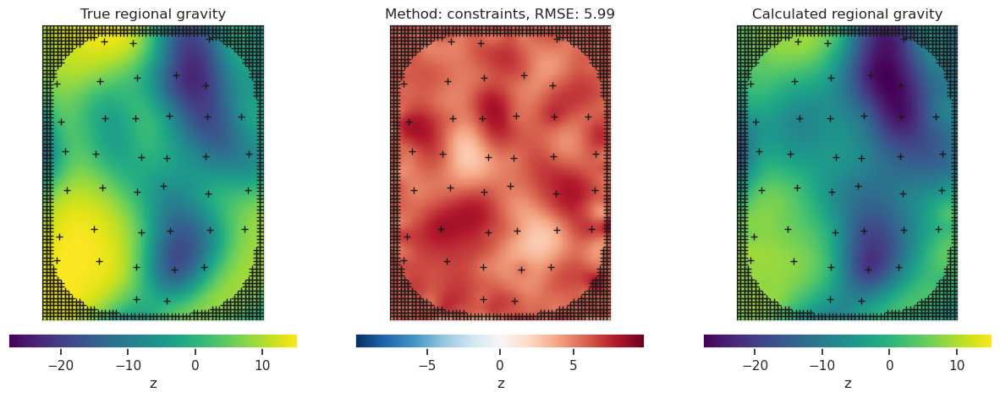

In [86]:
# contaminate with noise
grav_survey_df_noise = grav_survey_df.copy()
grav_survey_df_noise["Gobs"] = synthetic.contaminate(
    grav_survey_df_noise.Gobs,
    stddev=0.02,
    percent=True,
    seed=0,
)

regional_kwargs = dict(
    input_grav=grav_survey_df_noise,
    input_forward_column="bed_forward",
    input_grav_column="Gobs",
    grav_spacing=grav_spacing,
    inversion_region=inversion_region,
    true_regional=grav_df.set_index(["northing", "easting"]).to_xarray().basement,
    constraints=constraints,
    grid_method="verde",
    dampings=np.logspace(-15, -5, num=8),
    # grid_method="pygmt",
    # tension_factor = 0,
    # constraint_block_size=grav_spacing,
    # block_size= grav_spacing,
    regional_method="constraints",
    # regional_method = "trend",
    # trend=10,
    # regional_method = "eq_sources",
    # eq_sources = 500e3,
)

with warnings.catch_warnings():
    warnings.simplefilter("ignore", sp.linalg.LinAlgWarning)
    df_survey_anomalies = regional.regional_seperation(
        **regional_kwargs,
        constraint_weights=1 / (constraints.uncert**2),
    )

anom_grids = plotting.anomalies_plotting(
    df_survey_anomalies,
    title=f" Method: {regional_kwargs.get('regional_method')}",
    constraints=constraints,  # .rename(columns={"easting":"x","northing":"y"}),
    input_forward_column="bed_forward",
    input_grav_column="Gobs",
    # plot_type="pygmt",
    plot_type="xarray",
    robust=False,
)

dif = (
    regional_kwargs.get("true_regional")
    - df_survey_anomalies.set_index(["northing", "easting"]).to_xarray().reg
)
_ = utils.grd_compare(
    regional_kwargs.get("true_regional"),
    df_survey_anomalies.set_index(["northing", "easting"]).to_xarray().reg,
    grid1_name="True regional gravity",
    grid2_name="Calculated regional gravity",
    title=f"Method: {regional_kwargs.get('regional_method')}",
    plot=True,
    region=regional_kwargs.get("inversion_region"),
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    plot_type="xarray",
    # plot_type="pygmt",
    # cmap="viridis",
    # diff_cmap=f"vik+h{np.nanmean(dif)}",
    hist=True,
    inset=False,
    # points_style = "x.2c",
    # points_pen = "1.5p",
    subplot_labels=True,
    # robust=True,
    robust=False,
    verbose="q",
    cbar_label="mGal",
)

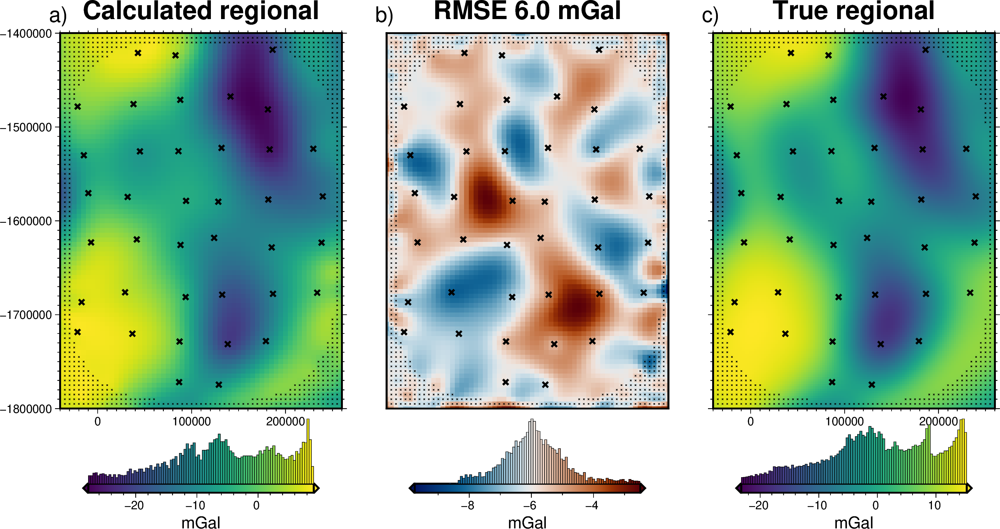

In [58]:
# ds = df_survey_anomalies[df_survey_anomalies.test==False].set_index(['northing','easting']).to_xarray()


# fig = maps.plot_grd(
#     ds.reg,
#     fig_height=10,
#     cmap="viridis",
#     title="Calculated regional",
#     cbar_label="mGal",
#     frame=["nSWe", "xaf10000", "yaf10000"],
#     hist=True,
#     cbar_yoffset=2,
#     points = constraints[constraints.inside].rename(columns={"easting":"x","northing":"y"}),
#     points_style = "x.2c",
#     points_pen= "1.5p",
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="a)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )
# fig.plot(
#     x = constraints[constraints.inside==False].easting,
#     y = constraints[constraints.inside==False].northing,
#     style = "x.05c",
# )

# dif = ds.reg - true_regional_grav
# fig = maps.plot_grd(
#     dif,
#     fig_height=10,
#     cmap=f"vik+h{np.nanmedian(dif)}",
#     title=f"RMSE {round(inv_utils.RMSE(dif),1)} mGal",
#     cbar_label="mGal",
#     hist=True,
#     cbar_yoffset=2,
#     grd2_cpt=True,
#     fig=fig,
#     origin_shift="xshift",
#     xshift_amount=1.1,
#     points = constraints[constraints.inside].rename(columns={"easting":"x","northing":"y"}),
#     points_style = "x.2c",
#     points_pen= "1.5p",
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="b)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )
# fig.plot(
#     x = constraints[constraints.inside==False].easting,
#     y = constraints[constraints.inside==False].northing,
#     style = "x.05c",
# )

# fig = maps.plot_grd(
#     true_regional_grav,
#     fig_height=10,
#     cmap="viridis",
#     title="True regional",
#     cbar_label="mGal",
#     frame=["nSwe", "xaf10000", "yaf10000"],
#     hist=True,
#     cbar_yoffset=2,
#     fig=fig,
#     origin_shift="xshift",
#     xshift_amount=1.1,
#     points = constraints[constraints.inside].rename(columns={"easting":"x","northing":"y"}),
#     points_style = "x.2c",
#     points_pen= "1.5p",
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="c)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )
# fig.plot(
#     x = constraints[constraints.inside==False].easting,
#     y = constraints[constraints.inside==False].northing,
#     style = "x.05c",
# )

# fig.show()

In [19]:
# df_survey_anomalies.to_csv(
#     "../synthetic_data/Ross_Sea_gravity_anomalies_survey_noise.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )

In [87]:
df_survey_anomalies = pd.read_csv(
    "../synthetic_data/Ross_Sea_gravity_anomalies_survey_noise.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df_survey_anomalies

,northing,easting,Gobs,test,upward,bed_forward,Gobs_shift,misfit,reg,res
0,-1800000.0,-40000.0,14.221879,False,1000.0,1.588803,8.463925,6.875122,6.583004,0.292119
1,-1800000.0,-37500.0,14.049177,True,1000.0,2.189981,8.291223,6.101242,6.636518,-0.535276
2,-1800000.0,-35000.0,15.023846,False,1000.0,2.731633,9.265892,6.534258,6.664664,-0.130406
3,-1800000.0,-32500.0,16.324893,True,1000.0,3.225948,10.566939,7.340991,6.627477,0.713514
4,-1800000.0,-30000.0,16.539822,False,1000.0,3.687668,10.781868,7.094200,6.543382,0.550817
...,...,...,...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-20.384565,False,1000.0,-16.379783,-26.142520,-9.762737,-9.479548,-0.283189
19477,-1400000.0,252500.0,-20.635912,True,1000.0,-16.835889,-26.393866,-9.557976,-10.144455,0.586479
19478,-1400000.0,255000.0,-22.112194,False,1000.0,-17.321311,-27.870148,-10.548837,-10.649994,0.101157
19479,-1400000.0,257500.0,-22.858240,True,1000.0,-17.722308,-28.616195,-10.893887,-10.890155,-0.003732


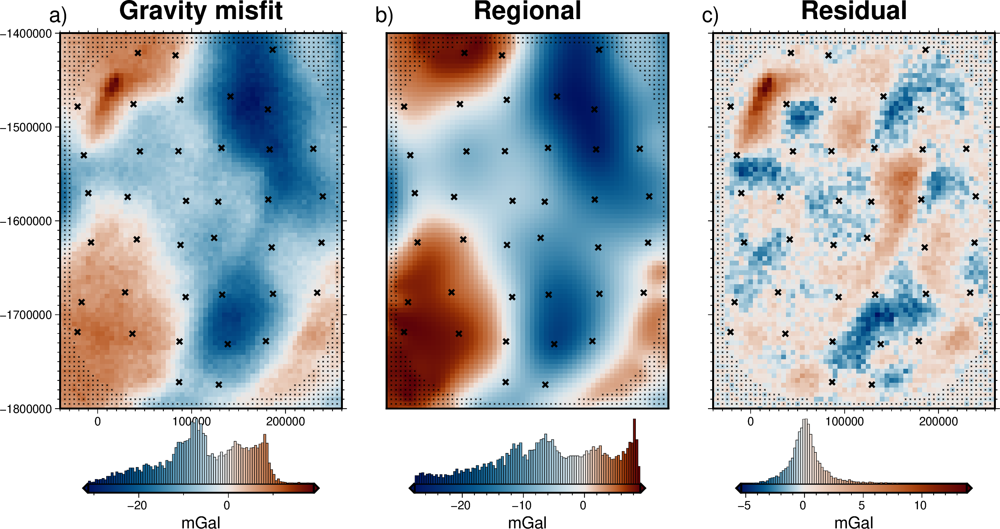

In [27]:
# grav_grids = df_survey_anomalies[df_survey_anomalies.test==False].set_index(["northing", "easting"]).to_xarray()

# fig = maps.plot_grd(
#     grav_grids.misfit,
#     fig_height=10,
#     cmap="vik+h0",
#     title="Gravity misfit",
#     cbar_label="mGal",
#     frame=["nSWe", "xaf10000", "yaf10000"],
#     hist=True,
#     cbar_yoffset=2,
#     points = constraints[constraints.inside].rename(columns={"easting":"x","northing":"y"}),
#     points_style = "x.2c",
#     points_pen= "1.5p",
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="a)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )
# fig.plot(
#     x = constraints[constraints.inside==False].easting,
#     y = constraints[constraints.inside==False].northing,
#     style = "x.05c",
# )

# fig = maps.plot_grd(
#     grav_grids.reg,
#     fig_height=10,
#     cmap="vik+h0",
#     title=f"Regional",
#     cbar_label="mGal",
#     hist=True,
#     cbar_yoffset=2,
#     grd2_cpt=True,
#     fig=fig,
#     origin_shift="xshift",
#     xshift_amount=1.1,
#     points = constraints[constraints.inside].rename(columns={"easting":"x","northing":"y"}),
#     points_style = "x.2c",
#     points_pen= "1.5p",
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="b)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )
# fig.plot(
#     x = constraints[constraints.inside==False].easting,
#     y = constraints[constraints.inside==False].northing,
#     style = "x.05c",
# )

# # plot the synthetic observed gravity grid
# fig = maps.plot_grd(
#     grav_grids.res,
#     fig_height=10,
#     cmap="vik+h0",
#     title="Residual",
#     cbar_label="mGal",
#     frame=["nSwe", "xaf10000", "yaf10000"],
#     hist=True,
#     cbar_yoffset=2,
#     fig=fig,
#     origin_shift="xshift",
#     xshift_amount=1.1,
#     points = constraints[constraints.inside].rename(columns={"easting":"x","northing":"y"}),
#     points_style = "x.2c",
#     points_pen= "1.5p",
# )
# fig.text(
#     position="TL",
#     justify="BL",
#     text="c)",
#     font="16p,Helvetica,black",
#     offset="j-.3/.3",
#     no_clip=True,
# )
# fig.plot(
#     x = constraints[constraints.inside==False].easting,
#     y = constraints[constraints.inside==False].northing,
#     style = "x.05c",
# )

# fig.show()

Damping values: [0.0001     0.00015849 0.00025119 0.00039811 0.00063096 0.001
 0.00158489 0.00251189 0.00398107 0.00630957 0.01       0.01584893
 0.02511886 0.03981072 0.06309573 0.1       ]
Best score: 0.6674461284899268
Best damping: 0.06309573444801936


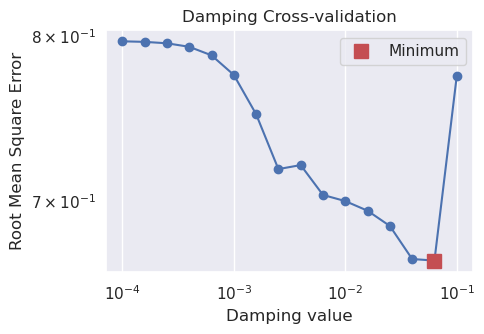

In [88]:
starting_prisms = copy.deepcopy(bed_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    region=inversion_region,
)
starting_prisms["weights"] = min_dist

# set kwargs for inversion
kwargs = dict(
    input_grav_column="Gobs_shift",
    prism_layer=starting_prisms,
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    constraints=constraints,
)

fname = "../synthetic_data/Ross_Sea_survey_noise_damping_CV"
# fname = "../synthetic_data/Ross_Sea_survey_noise_damping_CV_2500_dens"

dampings = np.logspace(-4, -1, 16)
print(f"Damping values: {dampings}")

# scores, rmses = inv.inversion_optimal_parameters(
#     training_data= df_survey_anomalies[df_survey_anomalies.test==False],
#     testing_data = df_survey_anomalies[df_survey_anomalies.test==True],
#     parameter_values = dampings,
#     function = inv.inversion_damping_MSE,
#     plot = False,
#     plot_grids = False,
#     results_fname=fname,
#     progressbar=True,
#     true_surface=bed,
#     inversion_region=inversion_region,
#     **kwargs,
# )

# # put scores and damping values into dict
# CV_results = dict(
#     scores=scores, dampings=dampings, rmses=rmses)

# # remove if exists
# pathlib.Path(fname).unlink(missing_ok=True)

# # save scores and dampings to pickle
# with open(f"{fname}.pickle", 'wb') as f:
#     pickle.dump(CV_results, f)

# load scores and dampings from pickle
with open(f"{fname}.pickle", "rb") as f:
    CV_results = pickle.load(f)

best = np.argmin(CV_results["scores"])
print("Best score:", CV_results["scores"][best])
print("Best damping:", CV_results["dampings"][best])

# get best inversion result of each set
with open(f"{fname}_trial_{best}.pickle", "rb") as f:
    inv_result = pickle.load(f)

plotting.plot_parameter_cv(
    CV_results["scores"],
    CV_results["dampings"],
    logx=True,
    logy=True,
    param_name="Damping",
)

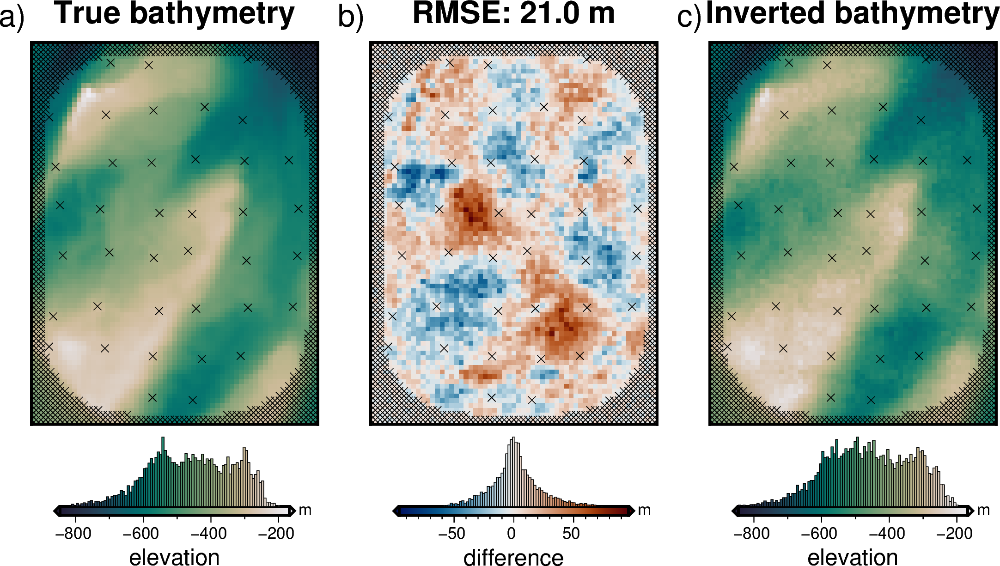

RMSE: 21.045052179991234
constraints RMSE: 0.27


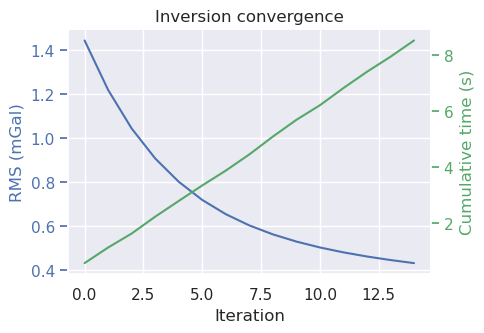

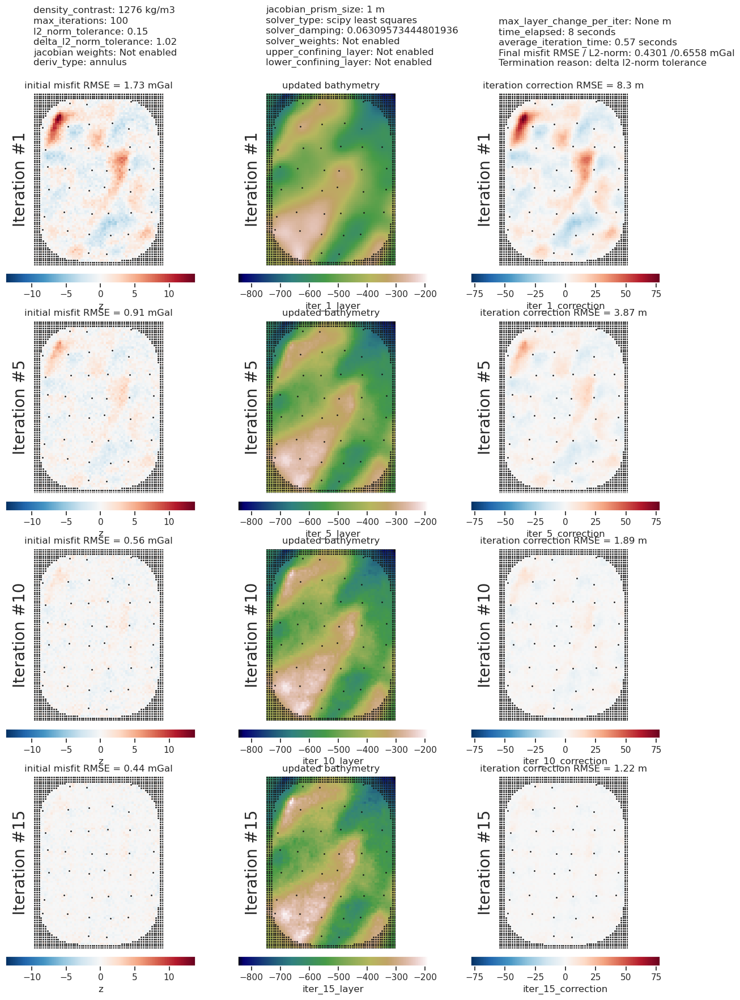

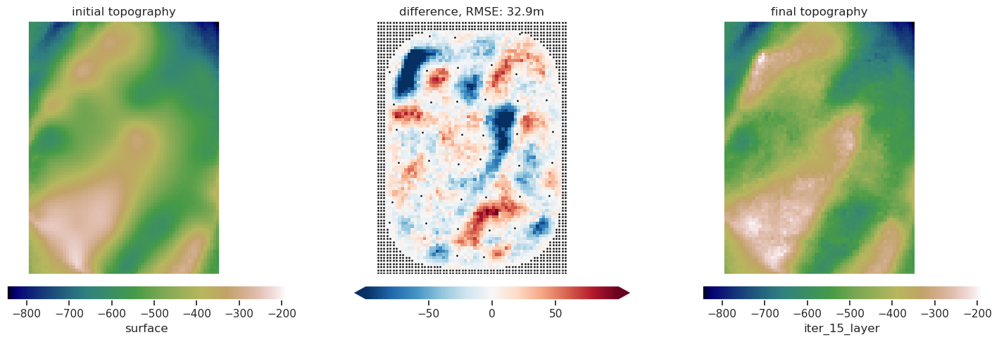

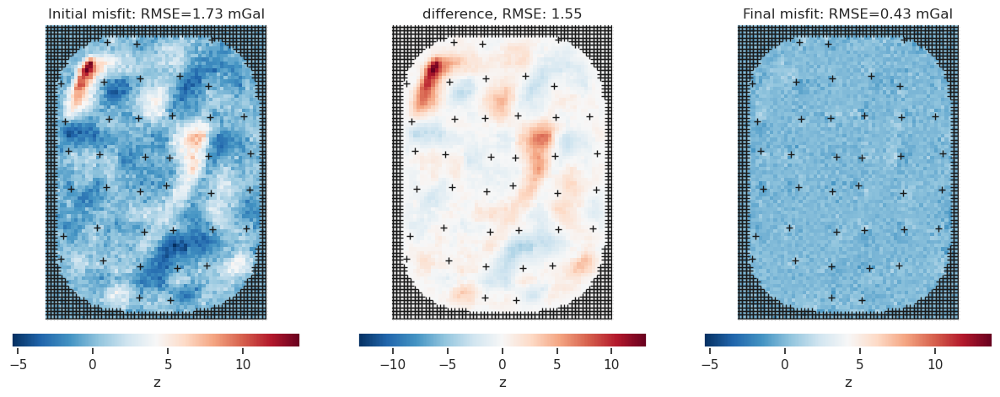

In [89]:
with inv_utils.HiddenPrints():
    _ = inv.inversion_RMSE(
        results=inv_result,
        input_grav=df_survey_anomalies[df_survey_anomalies.test == False],
        inversion_region=inversion_region,
        true_surface=bed,
        plot=True,
        plot_type="pygmt",
        xshift_amount=1.1,
        label_offset="j-.6c/.3c",
        title_font="16p,Helvetica-Bold,black",
        **kwargs,
    )

plotting.plot_convergence(inv_result[2], iter_times=inv_result[3]["iter_times"])

_ = plotting.plot_inversion_results(
    inv_result[2],
    inv_result[1],
    inv_result[3],
    grav_region=inversion_region,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    iters_to_plot=4,
    grav_spacing=grav_spacing,
    constraints=constraints,
)

print(f"RMSE: {inv_result[0]}")
print(f"constraints RMSE: {inv_result[-1]}")

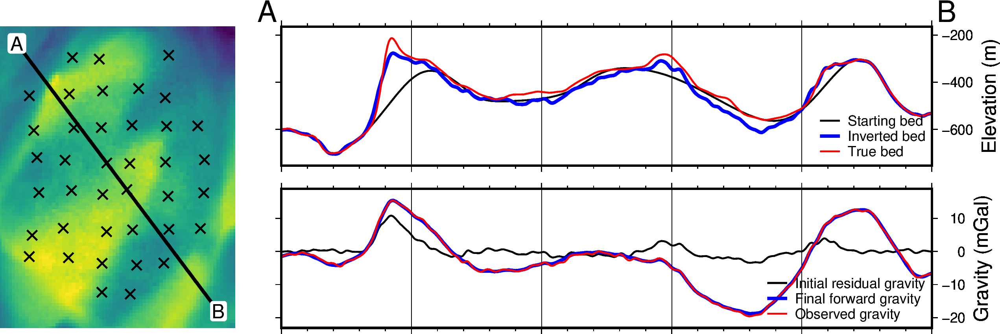

In [64]:
plotting.plot_inversion_results_profile(
    inv_result[1],
    inv_result[2],
    input_forward_column="bed_forward",
    constraints=constraints[constraints.inside],
    true_surface=bed,
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    map_buffer=0.05,
    subplot_orientation="horizontal",
    data_legend_loc="jBR+o0c",
    layers_legend_loc="jBR+o0c",
    layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
    data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
)

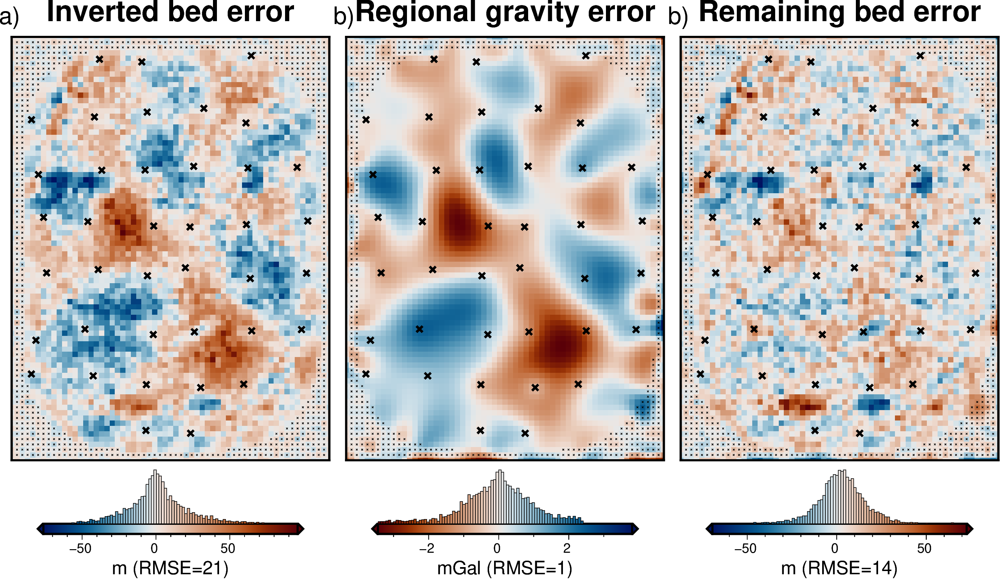

In [91]:
# inverted bed error
ds = inv_result[1].set_index(["northing", "easting"]).to_xarray()
cols = [s for s in inv_result[1].columns.to_list() if "_layer" in s]
final_bed = ds[cols[-1]]

final_bed = final_bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
true_bed = bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
bed_dif = true_bed - final_bed

# regional separation error
ds = (
    inv_result[2][inv_result[2].test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)
true_reg = true_regional_grav
reg_dif = true_reg - ds.reg
reg_dif -= np.nanmedian(reg_dif)

fig = maps.plot_grd(
    bed_dif,
    fig_height=10,
    title="Inverted bed error",
    hist=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
    cmap="vik+h0",
    cbar_label=f"m (RMSE={int(inv_utils.RMSE(bed_dif))})",
    cbar_yoffset=1.5,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)

fig = maps.plot_grd(
    reg_dif,
    title="Regional gravity error",
    cmap=f"vik+h0",
    reverse_cpt=True,
    fig=fig,
    hist=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
    origin_shift="xshift",
    cbar_label=f"mGal (RMSE={int(inv_utils.RMSE(reg_dif))})",
    cbar_yoffset=1.5,
)

fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)


min_max = utils.get_min_max(bed_dif, robust=True)
norm_reg_dif = -1 * inv_utils.normalize_xarray(reg_dif, low=min_max[0], high=min_max[1])
bed_dif_after_regional_error = bed_dif - norm_reg_dif

fig = maps.plot_grd(
    bed_dif_after_regional_error,
    title="Remaining bed error",
    cmap=f"vik+h{np.nanmedian(bed_dif_after_regional_error)}",
    fig=fig,
    hist=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
    origin_shift="xshift",
    cbar_label=f"m (RMSE={int(inv_utils.RMSE(bed_dif_after_regional_error))})",
    cbar_yoffset=1.5,
)

fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)

fig.show()

In [92]:
# # save final bed

# output = final_bed.to_dataset(name="z")
# output.to_zarr(
#     "../synthetic_data/Ross_Sea_inverted_bed_survey_noise_2500_dens.zarr",
#     encoding={"z": {"compressor": zarr.Blosc()}},
#     mode="w",
# )

# Ensemble of noise levels and cell sizes

In [21]:
full_res_grav_grid = (
    grav_df[grav_df.test == False].set_index(["northing", "easting"]).to_xarray()
)
full_res_grav_grid

<xarray.Dataset>
Dimensions:      (northing: 81, easting: 61)
Coordinates:
  * northing     (northing) float64 -1.8e+06 -1.795e+06 ... -1.405e+06 -1.4e+06
  * easting      (easting) float64 -4e+04 -3.5e+04 -3e+04 ... 2.55e+05 2.6e+05
Data variables:
    basement     (northing, easting) float64 10.95 11.63 12.2 ... -6.26 -8.327
    bathymetry   (northing, easting) float64 1.539 2.738 3.461 ... -17.32 -18.19
    Gobs         (northing, easting) float64 12.49 14.37 15.66 ... -23.58 -26.51
    test         (northing, easting) bool False False False ... False False
    upward       (northing, easting) float64 1e+03 1e+03 1e+03 ... 1e+03 1e+03
    bed_forward  (northing, easting) float64 1.589 2.732 3.688 ... -17.32 -18.11
    Gobs_shift   (northing, easting) float64 6.56 8.433 9.724 ... -29.51 -32.45
    misfit       (northing, easting) float64 4.971 5.701 6.036 ... -12.19 -14.33

In [22]:
def synthetic_survey(
    region,
    ew_spacing,
    ns_spacing,
    ew_to_remove=None,
    ns_to_remove=None,
    observation_height=1e3,
    along_line_spacing=1e3,
    offset=7e3,
):
    # irregular grid
    # simulate N-S tie lines
    x = np.arange(inversion_region[0] + offset, inversion_region[1], ns_spacing)
    y = np.arange(inversion_region[2], inversion_region[3], along_line_spacing)

    # remove the 3rd and 9th N-S lines
    if ew_to_remove is not None:
        x = np.delete(x, ew_to_remove)

    coords = np.meshgrid(x, y)
    # turn coordinates into dataarray
    ties = vd.make_xarray_grid(
        coords,
        data=np.ones_like(coords[0]) * observation_height,
        data_names="upward",
        dims=("northing", "easting"),
    )
    # turn dataarray into dataframe
    df_ties = vd.grid_to_table(ties)

    # simulate E-W flight lines
    x = np.arange(region[0], region[1], along_line_spacing)
    y = np.arange(region[2] + offset, region[3], ew_spacing)

    # remove a few E-W lines, starting from bottom
    if ns_to_remove is not None:
        y = np.delete(y, ns_to_remove)

    coords = np.meshgrid(x, y)
    # turn coordinates into dataarray
    lines = vd.make_xarray_grid(
        coords,
        data=np.ones_like(coords[0]) * observation_height,
        data_names="upward",
        dims=("northing", "easting"),
    )
    # turn dataarray into dataframe
    df_lines = vd.grid_to_table(lines)

    # merge dataframes
    df = pd.concat([df_ties, df_lines])

    return df

In [23]:
# # spacings = [60e3, 80e3]
# # noise_levels = [0, .09] # decimal percent gaussian noise

# noise_levels = [0, .01, .02, .03, .04, .05, .06, .07, .08, .09] # decimal percent gaussian noise
# spacings = [10e3, 20e3, 30e3, 40e3, 50e3, 60e3, 70e3, 80e3, 90e3, 100e3]

# param_coords = []
# eq_scores = []
# anom_dfs = []
# survey_dfs = []
# for (n,s) in product(noise_levels, spacings, desc="Noise/Spacing"):
#     param_coords.append([n,s])

#     survey = synthetic_survey(
#         inversion_region,
#         ew_spacing=s,
#         ns_spacing=s,
#         ew_to_remove=None,
#         ns_to_remove=None,
#         observation_height = 1e3,
#         along_line_spacing = 5e3,
#         offset = 7e3,
#     )
#     # sample the data at the observation points
#     grav_survey = profile.sample_grids(
#         survey, full_res_grav_grid.Gobs, "Gobs", coord_names=("easting", "northing")
#     )

#     coords = (grav_survey.easting, grav_survey.northing, grav_survey.upward)
#     data = grav_survey.Gobs

#     dampings = [10**-5, 10**1]
#     depths = [1e3, 100e3]

#     study_df, eqs = inv_utils.optimize_eq_source_params(
#         coords,
#         data,
#         n_trials=5,
#         damping_limits=dampings,
#         depth_limits=depths,
#         parallel=False,
#         plot=False,
#         eq_kwargs = dict(block_size=layer_spacing,),
#     )

#     grid_coords = vd.grid_coordinates(
#         region=inversion_region,
#         spacing=layer_spacing/2,
#         extra_coords=coords[2].max(),
#     )
#     # predict sources onto grid to get regional
#     Gobs_survey = eqs.grid(grid_coords, data_names="Gobs_eqs").Gobs_eqs

#     # get score
#     eq_score = study_df.iloc[0].value

#     df = vd.grid_to_table(Gobs_survey)
#     df['test'] = True
#     train_df = df[
#         (df.easting.isin(Gobs_survey.easting.values[::2])) &
#         (df.northing.isin(Gobs_survey.northing.values[::2]))
#     ].copy()
#     train_df['test'] = False

#     df = df.set_index(['northing', 'easting'])
#     df.update(train_df.set_index(['northing', 'easting']))
#     df.reset_index(inplace=True)

#     df["upward"] = 1e3
#     df["bed_forward"]=df_anomalies.bed_forward

#     # add noise to data
#     df["Gobs"] = synthetic.contaminate(
#         df.Gobs_eqs,
#         stddev=n,
#         percent=True,
#         seed=0,
#     )

#     regional_kwargs = dict(
#         input_grav=df,
#         input_forward_column="bed_forward",
#         input_grav_column="Gobs",
#         grav_spacing=grav_spacing,
#         inversion_region=inversion_region,
#         true_regional=grav_df.set_index(["northing", "easting"]).to_xarray().basement,
#         constraints=constraints,
#         grid_method="verde",
#         dampings=np.logspace(-15, -5, num=8),
#         regional_method = "constraints",
#     )

#     with warnings.catch_warnings():
#         warnings.simplefilter("ignore", sp.linalg.LinAlgWarning)
#         df = regional.regional_seperation(
#             **regional_kwargs,
#             constraint_weights = 1/(constraints.uncert**2),
#         )

#     eq_scores.append(eq_score)
#     anom_dfs.append(df)
#     survey_dfs.append(survey)

# ensemble_fname = "../synthetic_data/Ross_Sea_gravity_ensemble_5k"
# # ensemble_fname = "../synthetic_data/Ross_Sea_gravity_ensemble"

# # save results to pickle dataframes
# with open(f"{ensemble_fname}_anomalies.pickle", 'wb') as fout:
#     pickle.dump(anom_dfs, fout)
# with open(f"{ensemble_fname}_noise_spacing.pickle", 'wb') as fout:
#     pickle.dump(param_coords, fout)
# with open(f"{ensemble_fname}_eq_scores.pickle", 'wb') as fout:
#     pickle.dump(eq_scores, fout)
# with open(f"{ensemble_fname}_surveys.pickle", 'wb') as fout:
#     pickle.dump(survey_dfs, fout)

In [24]:
ensemble_fname = "../synthetic_data/Ross_Sea_gravity_ensemble_5k"
# ensemble_fname = "../synthetic_data/Ross_Sea_gravity_ensemble"

with open(f"{ensemble_fname}_anomalies.pickle", "rb") as f:
    anom_dfs = pickle.load(f)
with open(f"{ensemble_fname}_noise_spacing.pickle", "rb") as f:
    param_coords = pickle.load(f)
with open(f"{ensemble_fname}_eq_scores.pickle", "rb") as f:
    eq_scores = pickle.load(f)
with open(f"{ensemble_fname}_surveys.pickle", "rb") as f:
    survey_dfs = pickle.load(f)

print(len(anom_dfs))
print(len(param_coords))
print(len(eq_scores))
print(len(survey_dfs))

# df = pd.DataFrame({
#     "noise": [x[0] for x in param_coords],
#     "spacing": [x[1] for x in param_coords],
# })
# df

100
100
100
100


In [44]:
# for i in df:
#     survey_grid = anom_dfs[i][anom_dfs[i].test==False].set_index(["northing","easting"]).to_xarray().Gobs

#     dif = full_res_grav_grid.Gobs - survey_grid

#     rms = inv_utils.RMSE()

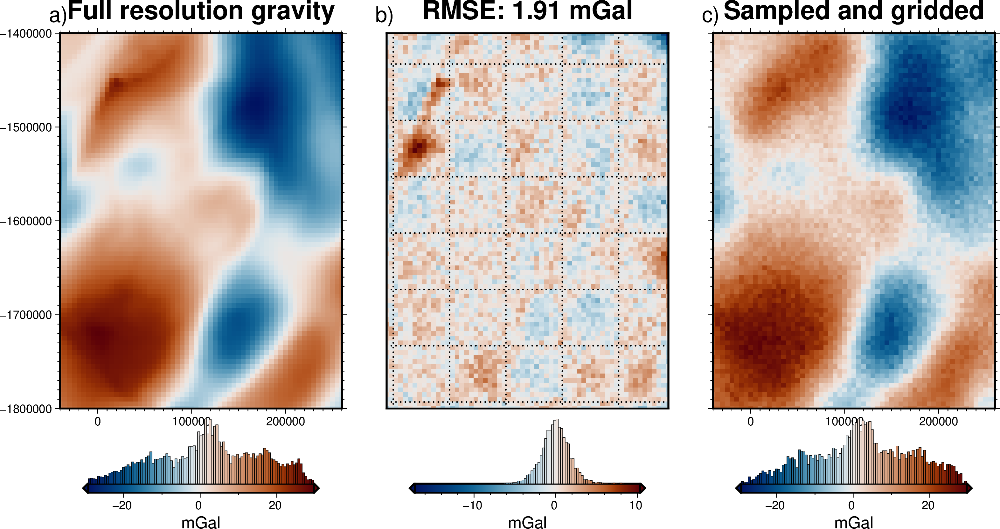

In [65]:
# plot the synthetic gravity anomaly grid
# i = 9
# i = df[(df.noise==0) & (df.spacing==10e3)].index[0]
# i = df[(df.noise==.09) & (df.spacing==10e3)].index[0]
# i = df[(df.noise==.09) & (df.spacing==100e3)].index[0]
# i = df[(df.noise==0) & (df.spacing==100e3)].index[0]
i = df[(df.noise == 0.04) & (df.spacing == 60e3)].index[0]

survey_grid = (
    anom_dfs[i][anom_dfs[i].test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
    .Gobs
)
survey_df = survey_dfs[i]
lims = utils.get_min_max(full_res_grav_grid.Gobs)

fig = maps.plot_grd(
    full_res_grav_grid.Gobs,
    fig_height=10,
    cmap="vik",
    cpt_lims=lims,
    title="Full resolution gravity",
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

dif = full_res_grav_grid.Gobs - survey_grid
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="vik+h0",
    title=f"RMSE: {round(inv_utils.RMSE(dif),2)} mGal",
    cbar_label="mGal",
    hist=True,
    cbar_yoffset=2,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
)

# plot observation points
fig.plot(survey_df[["easting", "northing"]], style="c.04c", color="black")
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# plot the synthetic observed gravity grid
fig = maps.plot_grd(
    survey_grid,
    fig_height=10,
    cmap="vik",
    cpt_lims=lims,
    title="Sampled and gridded",
    cbar_label="mGal",
    frame=["nSwe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.show()

In [57]:
# set kwargs for inversion
inversion_kwargs = dict(
    input_grav_column="Gobs_shift",
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
    prism_layer=starting_prisms,
)

starting_prisms = copy.deepcopy(bed_prisms)

min_dist = inv_utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    region=inversion_region,
)
starting_prisms["weights"] = min_dist

dampings = np.logspace(-4, -1, 10)
# dampings = [10**-3, 10**-2.8]
print(f"Damping values: {dampings}")


ensemble_fname = "../synthetic_data/Ross_Sea_gravity_ensemble_5k"
# ensemble_fname = "../synthetic_data/Ross_Sea_gravity_ensemble"

inversion_results = []
resulting_scores = []
resulting_dampings = []
resulting_rmses = []
for i, df in enumerate(tqdm(anom_dfs)):
    noise = param_coords[i][0]
    spacing = param_coords[i][1]

    # set name and storage for the optimization
    set_fname = f"{ensemble_fname}_noise_{noise}_spacing_{spacing}"

    #     with inv_utils.HiddenPrints():
    #         CV_scores, rmses = inv.inversion_optimal_parameters(
    #             training_data= df[df.test==False],
    #             testing_data = df[df.test==True],
    #             parameter_values = dampings,
    #             function = inv.inversion_damping_MSE,
    #             inversion_region = inversion_region,
    #             true_surface = bed,
    #             plot = False,
    #             plot_grids = False,
    #             results_fname = set_fname,
    #             progressbar=False,
    #             **inversion_kwargs,
    #         )

    #     # put all scores and damping values into dict
    #     CV_results = dict(CV_scores=CV_scores, dampings=dampings, rmses=rmses)

    #     # remove if exists
    #     pathlib.Path(f"{set_fname}.pickle").unlink(missing_ok=True)

    #     # save scores and dampings of each set to pickle
    #     with open(f"{set_fname}.pickle", 'wb') as f:
    #         pickle.dump(CV_results, f)

    # load scores and dampings of each set of noise/sampling
    with open(f"{set_fname}.pickle", "rb") as f:
        CV_results = pickle.load(f)

    # get best parameters of each set
    best = np.argmin(CV_results["CV_scores"])
    best_score = CV_results["CV_scores"][best]
    best_rmse = CV_results["rmses"][best]
    best_damping = CV_results["dampings"][best]

    # get best inversion result of each set
    with open(f"{set_fname}_trial_{best}.pickle", "rb") as f:
        inv_result = pickle.load(f)

    inversion_results.append(inv_result)
    resulting_dampings.append(best_damping)
    resulting_scores.append(best_score)
    resulting_rmses.append(best_rmse)

# df = pd.DataFrame({
#     "noise": [x[0] for x in param_coords],
#     "spacing": [x[1] for x in param_coords],
#     "Score": resulting_scores,
#     "RMSE": resulting_rmses,
#     "Damping": resulting_dampings,
#     "Eq source score": eq_scores,
# })

# df.to_csv(
#     f"{ensemble_fname}.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )
# df

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]


  0%|          | 0/100 [00:00<?, ?it/s]

In [3]:
ensemble_fname = "../synthetic_data/Ross_Sea_gravity_ensemble_5k"
# ensemble_fname = "../synthetic_data/Ross_Sea_gravity_ensemble"

df = pd.read_csv(
    f"{ensemble_fname}.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
df
# df.sort_values(by="Score")

,noise,spacing,Score,RMSE,Damping,Eq source score
0,0.00,10000.0,0.046744,15.188432,0.010000,0.999816
1,0.00,20000.0,0.031063,17.396257,0.010000,0.999359
2,0.00,30000.0,0.036218,18.907728,0.021544,0.999053
3,0.00,40000.0,0.058524,30.792211,0.010000,0.997612
4,0.00,50000.0,0.032317,27.226029,0.010000,0.998330
...,...,...,...,...,...,...
95,0.09,60000.0,2.784351,53.912290,0.046416,0.993507
96,0.09,70000.0,2.818507,55.688788,0.046416,0.998760
97,0.09,80000.0,2.844845,63.903529,0.046416,0.998095
98,0.09,90000.0,2.562756,54.824268,0.046416,0.998751


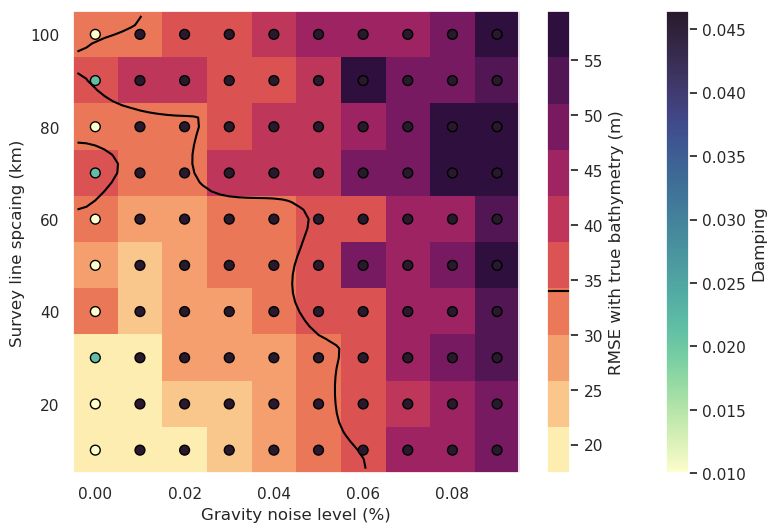

In [4]:
fig = plotting.plot_noise_spacing_ensemble(
    df,
    background="RMSE",
    background_title="RMSE with true bathymetry (m)",
    # background="Score",
    # background_title="Gravity CV score",
    # background="Damping",
    # background_title="Damping",
    # background="Eq source score",
    # background_title="Eq source score",
    # background_color_log = True,
    background_robust=True,
    # points_color=df.RMSE,
    points_color=df.Damping,
    # points_color=df["Eq source score"],
    # points_color=df.Score,
    # points_size=df.RMSE,
    # points_size=df.Score,
    # points_scaling=80,
    # points_color_log=True,
    points_robust=True,
    plot_contours=[34],
)

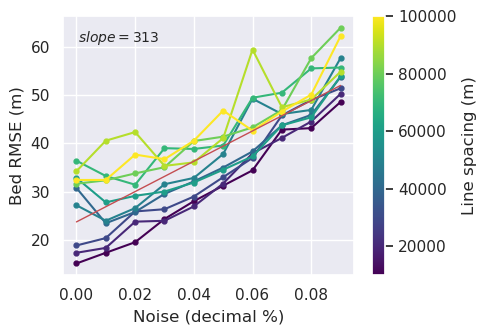

In [112]:
plotting.plot_ensemble_as_lines(
    df,
    x_col="noise",
    groupby_col="spacing",
    x_label="Noise (decimal %)",
    cbar_label="Line spacing (m)",
    trend_line=True,
)

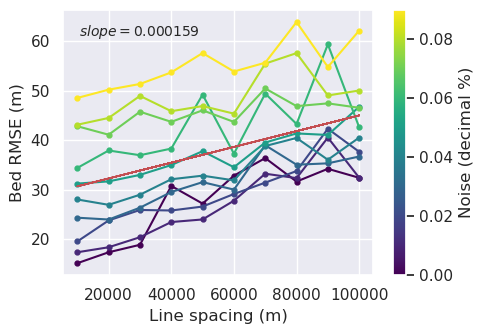

In [111]:
plotting.plot_ensemble_as_lines(
    df,
    x_col="spacing",
    groupby_col="noise",
    x_label="Line spacing (m)",
    cbar_label="Noise (decimal %)",
    trend_line=True,
)

In [ ]:
# df[(df.noise==0.0) & (df.cell_size==4000)]

In [ ]:
# choosen_result = inversion_results[df[(df.noise==0.0) & (df.cell_size==4000)].index[0]]
# choosen_result

In [ ]:
# _ = inv.inversion_RMSE(
#     results = choosen_result,
#     true_surface = bed,
#     inversion_region = inversion_region,
#     constraints = constraints,
#     plot=True,
#     # plot_type = "xarray",
#     # points_style="+.2c",
#     # robust=True,#False,
# )

In [61]:
# indices = np.linspace(df.spacing.idxmin(), df.spacing.idxmax(), 3, dtype="int")
# i = df[(df.noise==0) & (df.spacing==5e3)].index[0]
# i = df[(df.noise==.09) & (df.spacing==5e3)].index[0]
# i = df[(df.noise==.09) & (df.spacing==80e3)].index[0]
# i = df[(df.noise==0) & (df.spacing==80e3)].index[0]
indices = [
    df[(df.noise == 0.09) & (df.spacing == 10e3)].index[0],
    df[(df.noise == 0) & (df.spacing == 100e3)].index[0],
]

regionals = []
grids = []
for i in indices:
    print(i)

    choosen_result = inversion_results[i]
    print(df.loc[i])

    print("RMSE: ", choosen_result[0])

    ds = choosen_result[1].set_index(["northing", "easting"]).to_xarray()
    cols = [s for s in choosen_result[1].columns.to_list() if "_layer" in s]
    final_bed = ds[cols[-1]]

    final_bed = final_bed.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )
    true_bed = bed.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )
    bed_dif = true_bed - final_bed
    grids.append(bed_dif)

    ds = choosen_result[2].set_index(["northing", "easting"]).to_xarray()
    regionals.append(ds.reg)

90
noise                  0.090000
spacing            10000.000000
Score                  2.847739
RMSE                  48.571933
Damping                0.046416
Eq source score        0.999684
Name: 90, dtype: float64
RMSE:  48.57193288540621
9
noise                   0.000000
spacing            100000.000000
Score                   0.021383
RMSE                   32.439648
Damping                 0.010000
Eq source score         0.990704
Name: 9, dtype: float64
RMSE:  32.439648214851964


In [ ]:
# survey_grid = anom_dfs[i][anom_dfs[i].test==False].set_index(["northing","easting"]).to_xarray().Gobs
# survey_df = survey_dfs[i]
# lims = utils.get_min_max(full_res_grav_grid.Gobs)

fig = maps.plot_grd(
    full_res_grav_grid.Gobs,
    fig_height=10,
    cmap="vik",
    cpt_lims=lims,
    title="Full resolution gravity",
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

dif = full_res_grav_grid.Gobs - survey_grid
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="vik+h0",
    title=f"RMSE: {round(inv_utils.RMSE(dif),2)} mGal",
    cbar_label="mGal",
    hist=True,
    cbar_yoffset=2,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
)

# plot observation points
fig.plot(survey_df[["easting", "northing"]], style="c.02c", color="black")
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# plot the synthetic observed gravity grid
fig = maps.plot_grd(
    survey_grid,
    fig_height=10,
    cmap="vik",
    cpt_lims=lims,
    title="Sampled and gridded",
    cbar_label="mGal",
    frame=["nSwe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.show()

# Ensemble of numbers of constraints

In [157]:
# constraints_all = pd.read_csv(
#     "../synthetic_data/Ross_Sea_synthetic_constraints_semiregular.csv.gz",
#     sep=",",
#     header="infer",
#     index_col=None,
#     compression="gzip",
# )

# outer_constraints = constraints_all[constraints_all.inside==False]

# fig = maps.plot_grd(
#     bed,
#     fig_height=8,
#     region=buffer_region,
#     show_region=inversion_region,
#     cbar_labels="bed elevation",
#     cbar_units="m",
# )

# fig.plot(
#     x=outer_constraints.easting,
#     y=outer_constraints.northing,
#     style="c.05c",
#     fill="black",
# )

# fig.plot(
#     "../data/Ross_Sea_outline.shp",
#     pen="0.2p,black",
# )

# fig.show()

In [158]:
# inside_constraints = synthetic.constraint_layout_spacing(
#     spacing = 100e3,
#     shift_stdev = 50e3,
#     region = inversion_region,
#     padding = -5e3,
#     shapefile = "../data/Ross_Sea_outline.shp",
#     plot=True,
# )

In [194]:
# constraints_all = pd.read_csv(
#     "../synthetic_data/Ross_Sea_synthetic_constraints_semiregular.csv.gz",
#     sep=",",
#     header="infer",
#     index_col=None,
#     compression="gzip",
# )
# outer_constraints = constraints_all[constraints_all.inside==False]

# grav_df = pd.read_csv(
#     "../synthetic_data/Ross_Sea_full_res_gravity.csv.gz",
#     # "../synthetic_data/Ross_Sea_airborne_survey_gravity.csv.gz",
#     sep=",",
#     header="infer",
#     index_col=None,
#     compression="gzip",
# )
# grav_df = inv_utils.prep_grav_data(
#     grav_df,
#     region=inversion_region,
#     input_grav_name="forward_total",
#     input_coord_names=("easting", "northing", "upward"),
# )

# regional_kwargs = dict(
#     input_forward_column="bed_forward",
#     input_grav_column="Gobs",
#     grav_spacing=grav_spacing,
#     inversion_region=inversion_region,
#     grid_method="verde",
#     dampings=np.logspace(-15, -5, num=8),
#     mindists=np.linspace(1, 5e3, 8),
#     regional_method = "constraints",
# )

# spacings = [10e3, 20e3, 30e3, 40e3, 50e3, 60e3, 70e3, 80e3, 90e3, 100e3]
# # spacings = [50e3, 100e3]

# constraint_sets = []
# anom_dfs = []
# starting_prism_sets = []
# for s in tqdm(spacings):

#     inside_constraints = synthetic.constraint_layout_spacing(
#         spacing = s,
#         shift_stdev = 0,
#         region = inversion_region,
#         padding = -5e3,
#         shapefile = "../data/Ross_Sea_outline.shp",
#         # plot=True,
#     )
#     new_constraints = pd.concat([outer_constraints, inside_constraints]).drop(
#         columns=["upward", "uncert"]
#     )

#     # sampled the true bed values at these points
#     new_constraints = profile.sample_grids(
#         new_constraints, bed, "upward", coord_names=("easting", "northing")
#     )

#     # add gaussian noise with stdev of 5 m for all points
#     new_constraints["upward"], new_constraints["uncert"] = synthetic.contaminate(
#         new_constraints.upward,
#         stddev=5,
#         percent=False,
#         seed=0,
#         return_stddev=True,
#     )

#     # for inside points, replace with gaussian noise with a stdev of
#     # 2% of each points depths
#     noise, uncert = synthetic.contaminate(
#         new_constraints[new_constraints.inside].upward,
#         stddev=0.02,
#         percent=True,
#         percent_as_max_abs=False,
#         seed=0,
#         return_stddev=True,
#     )
#     new_constraints.loc[new_constraints.inside, "upward"] = noise
#     new_constraints.loc[new_constraints.inside, "uncert"] = uncert

# #     dampings = list(np.logspace(-20, -5, num=3))
#     dampings = [10**-20]
#     with warnings.catch_warnings():
#         warnings.simplefilter("ignore", sp.linalg.LinAlgWarning)
#         spline = inv_utils.best_SplineCV(
#             coordinates = (new_constraints.easting, new_constraints.northing),
#             data = new_constraints.upward,
#             weights = 1/(new_constraints.uncert**2),
#             dampings=dampings,
#             delayed=False,
#         )
#     new_starting_bed = spline.grid(region=buffer_region, spacing=layer_spacing,).scalars

#     # drop buffer region constraints
#     new_constraints = utils.points_inside_region(
#         new_constraints, inversion_region,  names=("easting", "northing")
#     )

#     # recreate prism layer
#     bed_prisms = inv_utils.grids_to_prisms(
#         surface = new_starting_bed,
#         reference=np.nanmean(new_starting_bed.values),
#         density=xr.where(new_starting_bed >= np.nanmean(new_starting_bed.values), density, -density),
#     )

#     # calculate gravity of starting bed
#     bed_grav_grid, bed_grav_df = inv_utils.forward_grav_of_prismlayer(
#         [bed_prisms],
#         grav_df,
#         names=["bed_prisms"],
#         remove_median=False,
#         progressbar=True,
#         plot=False,
#     )
#     grav_df["bed_forward"] = bed_grav_df.forward_total

#     bed_grav_grid, bed_grav_df = inv_utils.forward_grav_of_prismlayer(
#         [bed_prisms],
#         grav_df,
#         names=["bed_prisms"],
#         remove_median=False,
#         progressbar=True,
#         plot=False,
#     )
#     grav_df["bed_forward"] = bed_grav_df.forward_total

#     # add noise
#     # grav_df["Gobs"] = synthetic.contaminate(
#     #     grav_df.Gobs,
#     #     stddev=0.02,
#     #     percent=True,
#     #     seed=0,
#     # )

#     # remove regional field
#     with warnings.catch_warnings():
#         warnings.simplefilter("ignore", sp.linalg.LinAlgWarning)
#         df = regional.regional_seperation(
#             **regional_kwargs,
#             constraints=new_constraints,
#             input_grav=grav_df,
#             constraint_weights = 1/(new_constraints.uncert**2),
#         )

#     constraint_sets.append(new_constraints)
#     anom_dfs.append(df)
#     starting_prism_sets.append(bed_prisms)

# ensemble_fname = "../synthetic_data/Ross_Sea_constraints_ensemble"

# # save results to pickle dataframes
# with open(f"{ensemble_fname}_anomalies.pickle", 'wb') as fout:
#     pickle.dump(anom_dfs, fout)
# with open(f"{ensemble_fname}_constraints.pickle", 'wb') as fout:
#     pickle.dump(constraint_sets, fout)
# with open(f"{ensemble_fname}_prisms.pickle", 'wb') as fout:
#     pickle.dump(starting_prism_sets, fout)
# with open(f"{ensemble_fname}_spacings.pickle", 'wb') as fout:
#     pickle.dump(spacings, fout)

In [113]:
ensemble_fname = "../synthetic_data/Ross_Sea_constraints_ensemble"

with open(f"{ensemble_fname}_anomalies.pickle", "rb") as f:
    anom_dfs = pickle.load(f)
with open(f"{ensemble_fname}_constraints.pickle", "rb") as f:
    constraint_sets = pickle.load(f)
with open(f"{ensemble_fname}_prisms.pickle", "rb") as f:
    starting_prism_sets = pickle.load(f)
with open(f"{ensemble_fname}_spacings.pickle", "rb") as f:
    spacings = pickle.load(f)

print(len(anom_dfs))
print(len(constraint_sets))
print(len(starting_prism_sets))
print(spacings)

10
10
10
[10000.0, 20000.0, 30000.0, 40000.0, 50000.0, 60000.0, 70000.0, 80000.0, 90000.0, 100000.0]


In [24]:
# i = 9
# _ = plotting.anomalies_plotting(
#     anom_dfs[i],
#     constraints=constraint_sets[i],
#     input_forward_column="bed_forward",
#     input_grav_column="Gobs",
#     # plot_type="pygmt",
#     plot_type="xarray",
#     robust=False,
# )

In [117]:
# set kwargs for inversion
inversion_kwargs = dict(
    input_grav_column="Gobs_shift",
    max_iterations=100,
    l2_norm_tolerance=0.15,  # sqrt(RMS)=l2-norm, set to sqrt(noise)
    delta_l2_norm_tolerance=1.02,  # stop if l2-norm doesnt decrease by at least 1%
    weights_after_solving=True,
    deriv_type="annulus",
    solver_type="scipy least squares",
)

dampings = np.logspace(-4, -1, 10)
# dampings = [10**-3, 10**-2.8]
print(f"Damping values: {dampings}")

ensemble_fname = "../synthetic_data/Ross_Sea_constraints_ensemble"

inversion_results = []
resulting_scores = []
resulting_dampings = []
resulting_rmses = []
for i, df in enumerate(tqdm(anom_dfs)):
    spacing = spacings[i]

    # set name and storage for the optimization
    set_fname = f"{ensemble_fname}_spacing_{spacing}"

    #     # create weights grid
    #     starting_prisms = starting_prism_sets[i]
    #     min_dist = inv_utils.normalized_mindist(
    #         constraint_sets[i],
    #         starting_prisms,
    #         mindist = layer_spacing/np.sqrt(2),
    #         low = 0,
    #         high = 1,
    #         region=inversion_region,
    #     )
    #     starting_prisms["weights"] = min_dist

    #     inversion_kwargs["prism_layer"] = starting_prisms

    #     with inv_utils.HiddenPrints():
    #         CV_scores, rmses = inv.inversion_optimal_parameters(
    #             training_data= df[df.test==False],
    #             testing_data = df[df.test==True],
    #             parameter_values = dampings,
    #             function = inv.inversion_damping_MSE,
    #             inversion_region = inversion_region,
    #             true_surface = bed,
    #             plot = False,
    #             plot_grids = False,
    #             results_fname = set_fname,
    #             progressbar=False,
    #             **inversion_kwargs,
    #         )

    #     # put all scores and damping values into dict
    #     CV_results = dict(CV_scores=CV_scores, dampings=dampings, rmses=rmses)

    #     # remove if exists
    #     pathlib.Path(f"{set_fname}.pickle").unlink(missing_ok=True)

    #     # save scores and dampings of each set to pickle
    #     with open(f"{set_fname}.pickle", 'wb') as f:
    #         pickle.dump(CV_results, f)

    # load scores and dampings of each set of noise/sampling
    with open(f"{set_fname}.pickle", "rb") as f:
        CV_results = pickle.load(f)

    # get best parameters of each set
    best = np.argmin(CV_results["CV_scores"])
    best_score = CV_results["CV_scores"][best]
    best_rmse = CV_results["rmses"][best]
    best_damping = CV_results["dampings"][best]

    # get best inversion result of each set
    with open(f"{set_fname}_trial_{best}.pickle", "rb") as f:
        inv_result = pickle.load(f)

    inversion_results.append(inv_result)
    resulting_dampings.append(best_damping)
    resulting_scores.append(best_score)
    resulting_rmses.append(best_rmse)

# df = pd.DataFrame({
#     "spacing": spacings,
#     "Score": resulting_scores,
#     "RMSE": resulting_rmses,
#     "Damping": resulting_dampings,
#     "Constraints number": [len(x[x.inside]) for x in constraint_sets],
# })

# df.to_csv(
#     f"{ensemble_fname}.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )
# df

Damping values: [0.0001     0.00021544 0.00046416 0.001      0.00215443 0.00464159
 0.01       0.02154435 0.04641589 0.1       ]


  0%|          | 0/10 [00:00<?, ?it/s]

In [118]:
# # get starting bed RMSE's

# grids = []
# for i in starting_prism_sets:

#     choosen_result = inversion_results[i]
#     print(df.loc[i])

#     consts = constraint_sets[i]
#     print("num constraints: ", len(consts[consts.inside]))

#     print("RMSE: ",choosen_result[0])

#     ds = inversion_results[i][1].set_index(["northing","easting"]).to_xarray()
#     cols = [s for s in inversion_results[i][1].columns.to_list() if "_layer" in s]
#     final_bed = ds[cols[-1]]

#     final_bed = final_bed.sel(
#         easting=slice(inversion_region[0], inversion_region[1]),
#         northing=slice(inversion_region[2], inversion_region[3]),
#     )
#     true_bed = bed.sel(
#         easting=slice(inversion_region[0], inversion_region[1]),
#         northing=slice(inversion_region[2], inversion_region[3]),
#     )
#     bed_dif = true_bed - final_bed
#     grids.append(bed_dif)

TypeError: list indices must be integers or slices, not Dataset

In [119]:
ensemble_fname = "../synthetic_data/Ross_Sea_constraints_ensemble"

df = pd.read_csv(
    f"{ensemble_fname}.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# add starting errors to dataframe
starting_errors = []
for i in inversion_results:
    ds = i[1].set_index(["northing", "easting"]).to_xarray()
    starting_bed = ds.surface

    starting_bed = starting_bed.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )
    true_bed = bed.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )

    starting_error = true_bed - starting_bed
    starting_errors.append(utils.RMSE(starting_error))

df["starting_errors"] = starting_errors
df

,spacing,Score,RMSE,Damping,Constraints number,starting_errors
0,10000.0,0.051041,6.667725,0.021544,959,8.588895
1,20000.0,0.027623,7.154751,0.010000,235,13.988681
2,30000.0,0.040145,8.636405,0.010000,113,21.435350
3,40000.0,0.035892,10.912627,0.010000,59,25.571774
4,50000.0,0.035956,14.777748,0.010000,35,30.477776
5,60000.0,0.021436,25.654819,0.010000,31,42.004278
6,70000.0,0.034157,35.688680,0.010000,15,43.820521
7,80000.0,0.024736,49.025797,0.010000,15,48.497405
8,90000.0,0.027651,58.840643,0.010000,15,52.355587
9,100000.0,0.045166,63.770684,0.010000,9,55.986400


In [123]:
indices

array([0, 4, 9])

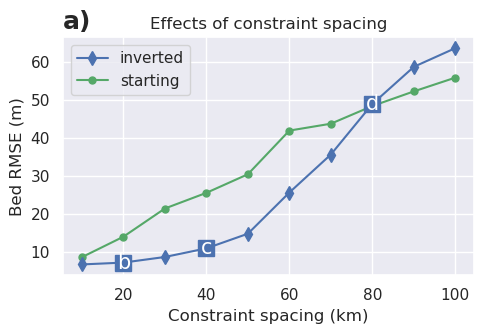

In [124]:
# indices = np.linspace(df.spacing.idxmin(), df.spacing.idxmax(), 3, dtype="int")
indices = [1, 3, 7]

plotting.plot_constraint_spacing_ensemble(
    df,
    # logy=True,
    # logx=True,
    # plot_constraints=True,
    plot_starting_error=True,
    highlight_points=indices,
    subplot_label="a)",
    # horizontal_line = 34,
)

In [125]:
# indices = np.linspace(df.spacing.idxmin(), df.spacing.idxmax(), 3, dtype="int")
indices = [1, 3, 7]

regionals = []
grids = []
for i in indices:
    print(i)

    choosen_result = inversion_results[i]
    print(df.loc[i])

    consts = constraint_sets[i]
    print("num constraints: ", len(consts[consts.inside]))

    print("RMSE: ", choosen_result[0])

    ds = choosen_result[1].set_index(["northing", "easting"]).to_xarray()
    cols = [s for s in choosen_result[1].columns.to_list() if "_layer" in s]
    final_bed = ds[cols[-1]]

    final_bed = final_bed.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )
    true_bed = bed.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )
    bed_dif = true_bed - final_bed
    grids.append(bed_dif)

    ds = choosen_result[2].set_index(["northing", "easting"]).to_xarray()
    regionals.append(ds.reg)

1
spacing               20000.000000
Score                     0.027623
RMSE                      7.154751
Damping                   0.010000
Constraints number      235.000000
starting_errors          13.988681
Name: 1, dtype: float64
num constraints:  235
RMSE:  7.154750685915444
3
spacing               40000.000000
Score                     0.035892
RMSE                     10.912627
Damping                   0.010000
Constraints number       59.000000
starting_errors          25.571774
Name: 3, dtype: float64
num constraints:  59
RMSE:  10.912627419292814
7
spacing               80000.000000
Score                     0.024736
RMSE                     49.025797
Damping                   0.010000
Constraints number       15.000000
starting_errors          48.497405
Name: 7, dtype: float64
num constraints:  15
RMSE:  49.02579679401821


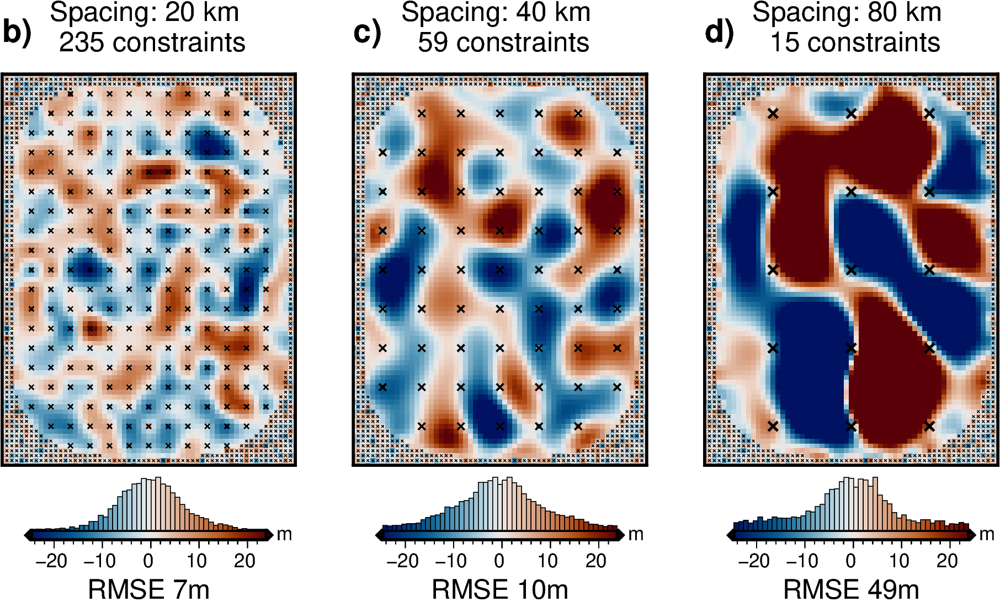

In [126]:
# set color limits
lims = [utils.get_min_max(i, robust=True) for i in grids]
# print(lims)
# # lims = [min([i[0] for i in lims]), max([i[1] for i in lims])]
# lims = [
#     utils.get_min_max([i[0] for i in lims], robust=True)[0],
#     utils.get_min_max([i[1] for i in lims], robust=True)[1]]
# use lims of middle grid
lims = lims[1]

for num, ind in enumerate(indices):
    if num == 0:
        fig = None
        origin_shift = "initialize"
        xshift_amount = None
    else:
        fig = fig
        origin_shift = "xshift"
        xshift_amount = 1.1

    fig = maps.plot_grd(
        grids[num],
        fig_height=6,
        title=f"Spacing: {int(df.loc[ind].spacing/1e3)} km @^ {int(df.loc[ind]['Constraints number'])} constraints",
        title_font="12p,Helvetica,black",
        points=constraint_sets[ind][constraint_sets[ind].inside].rename(
            columns={"easting": "x", "northing": "y"}
        ),
        points_style=f"x{.1*(1+num/2)}c",
        points_pen=f"{.5*(1+num/2)}p",
        cmap="vik+h0",
        cpt_lims=lims,
        cbar_label=f"RMSE {int(inv_utils.RMSE(grids[num]))}m",
        cbar_unit="m",
        hist=True,
        cbar_yoffset=1,
        hist_bin_num=50,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        fig=fig,
    )
    fig.text(
        position="TL",
        justify="BL",
        text=f"{string.ascii_lowercase[num+1]})",
        font="14p,Helvetica-Bold,black",
        offset="j0c/.5c",
        no_clip=True,
    )
    fig.plot(
        x=constraint_sets[ind][constraint_sets[ind].inside == False].easting,
        y=constraint_sets[ind][constraint_sets[ind].inside == False].northing,
        style="x.05c",
    )
fig.show()

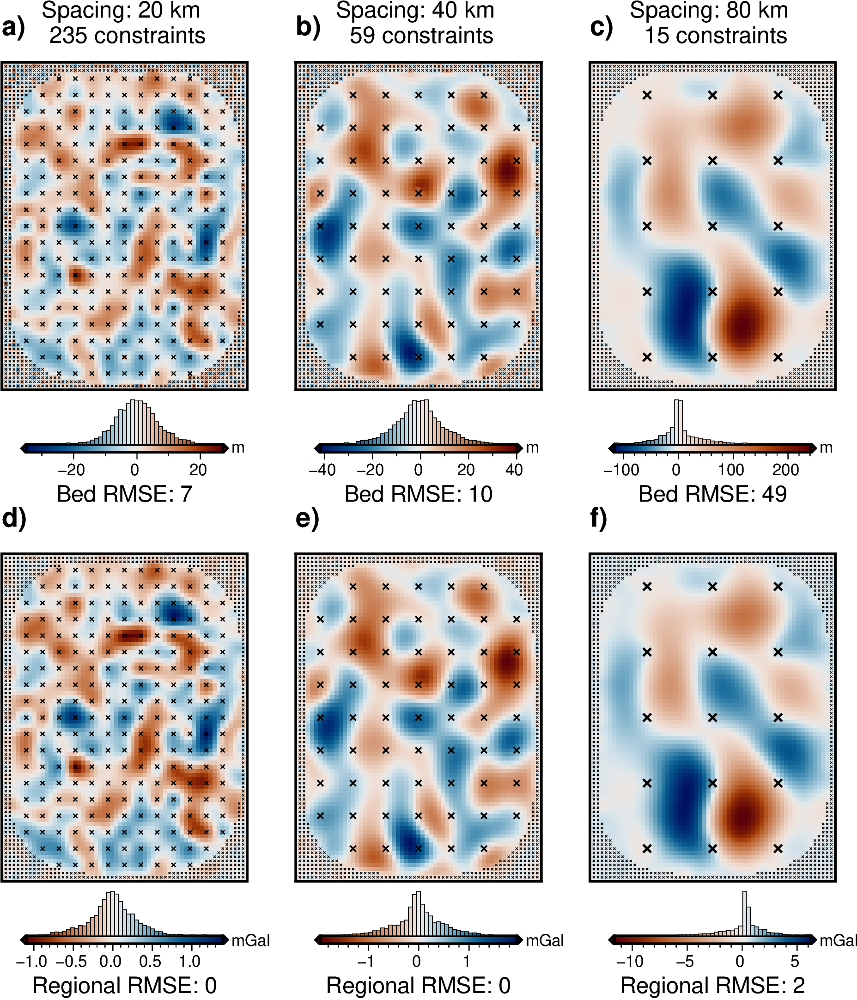

In [127]:
for num, ind in enumerate(indices):
    true_reg = true_regional_grav
    reg_dif = true_reg - regionals[num]
    reg_dif -= np.nanmean(reg_dif)

    if num == 0:
        fig = None
        origin_shift = "initialize"
        xshift_amount = 1
        yshift_amount = 1
    else:
        fig = fig
        origin_shift = "both_shift"
        xshift_amount = 1.1
        yshift_amount = 1

    fig = maps.plot_grd(
        grids[num],
        fig_height=6,
        title=f"Spacing: {int(df.loc[ind].spacing/1e3)} km @^ {int(df.loc[ind]['Constraints number'])} constraints",
        title_font="12p,Helvetica,black",
        points=constraint_sets[ind][constraint_sets[ind].inside].rename(
            columns={"easting": "x", "northing": "y"}
        ),
        points_style=f"x{.1*(1+num/2)}c",
        points_pen=f"{.5*(1+num/2)}p",
        cmap="vik+h0",
        cbar_label=f"Bed RMSE: {int(inv_utils.RMSE(grids[num]))}",
        cbar_unit="m",
        hist=True,
        cbar_yoffset=1,
        hist_bin_num=50,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        yshift_amount=yshift_amount,
        fig=fig,
    )

    fig.text(
        position="TL",
        justify="BL",
        text=f"{string.ascii_lowercase[num]})",
        font="14p,Helvetica-Bold,black",
        offset="j0c/.5c",
        no_clip=True,
    )
    fig.plot(
        x=constraint_sets[ind][constraint_sets[ind].inside == False].easting,
        y=constraint_sets[ind][constraint_sets[ind].inside == False].northing,
        style="x.05c",
    )
    fig = maps.plot_grd(
        reg_dif,
        fig_height=6,
        reverse_cpt=True,
        points=constraint_sets[ind][constraint_sets[ind].inside].rename(
            columns={"easting": "x", "northing": "y"}
        ),
        points_style=f"x{.1*(1+num/2)}c",
        points_pen=f"{.5*(1+num/2)}p",
        cmap="vik+h0",
        cbar_label=f"Regional RMSE: {int(inv_utils.RMSE(reg_dif))}",
        cbar_unit="mGal",
        hist=True,
        cbar_yoffset=1,
        hist_bin_num=50,
        origin_shift="both_shift",
        xshift_amount=0,
        yshift_amount=-1,
        fig=fig,
    )

    fig.text(
        position="TL",
        justify="BL",
        text=f"{string.ascii_lowercase[num+3]})",
        font="14p,Helvetica-Bold,black",
        offset="j0c/.5c",
        no_clip=True,
    )
    fig.plot(
        x=constraint_sets[ind][constraint_sets[ind].inside == False].easting,
        y=constraint_sets[ind][constraint_sets[ind].inside == False].northing,
        style="x.05c",
    )

fig.show()

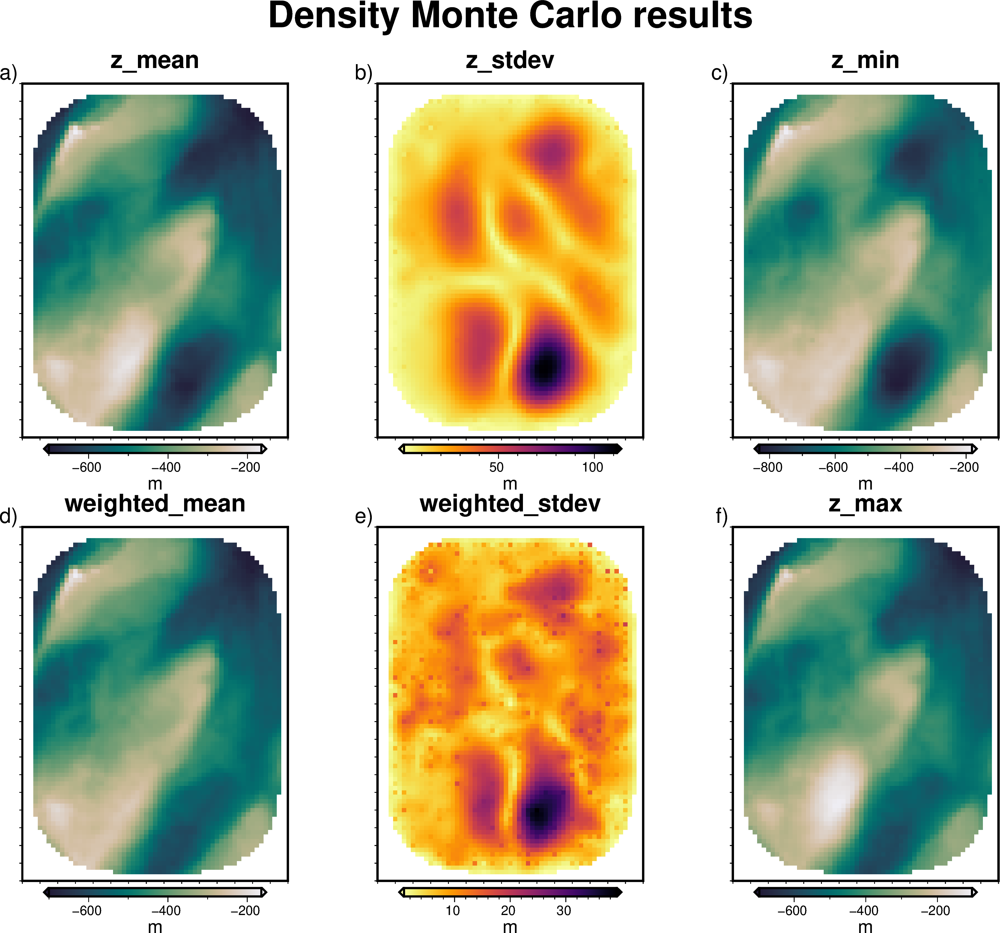

In [250]:
# # weights as RMSE of final inversion gravity misfit
# # grav_dfs = [i[2] for i in inversion_results]
# # weights = [utils.RMSE(df[list(df.columns)[-1]]) for df in grav_dfs]
# # weights as RMS bed error
# weights = [i[0] for i in inversion_results]
# weights = [1/(w**2) for w in weights]

# topo_dfs = [i[1] for i in inversion_results]
# topos = [df.set_index(["northing", "easting"]).to_xarray()[list(df.columns)[-1]] for df in topo_dfs]
# topos = [t.rename(f"run_{i}") for i,t in enumerate(topos)]
# topos_ds = xr.merge(topos)
# stats = inv_utils.model_ensemble_stats(topos_ds, weights = weights)
# merged, z_mean, z_stdev, weighted_mean, weighted_stdev, z_min, z_max = stats

# grids = [
#         z_mean, z_stdev, z_min,
#         weighted_mean, weighted_stdev, z_max,
#     ]

# grids = [
#         utils.mask_from_shp(shapefile="../data/Ross_Sea_outline.shp", xr_grid = i, masked=True, invert=False)
#         for i in grids]

# subplot_titles = [
#         "z_mean", "z_stdev", "z_min",
#         "weighted_mean", "weighted_stdev", "z_max",
#     ]

# fig = maps.subplots(
#     grids = grids,
#     region = inversion_region,
#     dims = (2, 3),
#     fig_title = "Density Monte Carlo results",
#     subplot_titles = subplot_titles,
#     cbar_labels = ["m" for x in grids],
#     autolabel = "a)+JTL",
#     fig_height = 10,
#     margins = "1c",
#     # grd2cpt=True,
#     cmaps = ["rain", "inferno", "rain",
#              "rain", "inferno", "rain",],
#     reverse_cpt=True,
#     # hist=True,
#     # cbar_yoffset=1.5,
# )
# fig.show()